In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import backend as K
from tensorflow.keras.applications import ResNet50
from skimage.metrics import structural_similarity as ssim
from skimage import color
import numpy as np
from PIL import Image
import os
import random
from tqdm import tqdm
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set global precision policy to float32
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('float32')

# Check for GPU availability
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPUs available: {len(gpus)}")
    for gpu in gpus:
        print(f"Device: {gpu.name}")
else:
    print("No GPU available. Using CPU.")

# Define the dataset directory
dataset_dir = 'Dataset_SOTS'

# Define directories for indoor and outdoor scenes
indoor_clear_dir = os.path.join(dataset_dir, 'indoor', 'clear')
indoor_hazy_dir = os.path.join(dataset_dir, 'indoor', 'hazy')
outdoor_clear_dir = os.path.join(dataset_dir, 'outdoor', 'clear')
outdoor_hazy_dir = os.path.join(dataset_dir, 'outdoor', 'hazy')

def load_image_paths(clear_dir, hazy_dir):
    """Load and match image file paths from clear and hazy directories."""
    clear_images = sorted(os.listdir(clear_dir))
    hazy_images = sorted(os.listdir(hazy_dir))
    
    clear_paths = []
    hazy_paths = []
    
    # Match hazy images with their corresponding clear images
    for clear_img in clear_images:
        clear_img_id = os.path.splitext(clear_img)[0]
        clear_img_path = os.path.join(clear_dir, clear_img)
        
        # Find corresponding hazy images
        hazy_matches = [img for img in hazy_images if img.startswith(clear_img_id)]
        hazy_matches.sort()  # Sort to ensure a consistent order
        
        for hazy_img in hazy_matches:
            hazy_img_path = os.path.join(hazy_dir, hazy_img)
            clear_paths.append(clear_img_path)
            hazy_paths.append(hazy_img_path)
    
    return np.array(clear_paths), np.array(hazy_paths)

# Load image paths for both indoor and outdoor scenes
indoor_clear_paths, indoor_hazy_paths = load_image_paths(indoor_clear_dir, indoor_hazy_dir)
outdoor_clear_paths, outdoor_hazy_paths = load_image_paths(outdoor_clear_dir, outdoor_hazy_dir)

# Combine indoor and outdoor scenes
clear_paths = np.concatenate([indoor_clear_paths, outdoor_clear_paths])
hazy_paths = np.concatenate([indoor_hazy_paths, outdoor_hazy_paths])

def preprocess_image(img_path, target_size=(512, 512)):
    """Preprocess an image: read, resize, and normalize using Pillow."""
    img_path = img_path.numpy().decode('utf-8')  # Convert EagerTensor to a string
    img = Image.open(img_path)  # Read image using Pillow
    img = img.resize(target_size)  # Resize image to target size
    img = np.array(img) / 255.0  # Convert to NumPy array and normalize to [0, 1]
    img = np.nan_to_num(img)  # Replace NaNs with zero
    return img

def preprocess_image_with_label(img_path, label_path, target_size=(512, 512)):
    """Preprocess both image and its label."""
    img = preprocess_image(img_path, target_size)
    label = preprocess_image(label_path, target_size)
    return img, label

def create_dataset(image_paths, label_paths, batch_size=8, target_size=(512, 512)):
    """Create a TensorFlow dataset."""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_paths))
    
    def load_and_preprocess(image_path, label_path):
        img, label = tf.py_function(
            preprocess_image_with_label, 
            [image_path, label_path], 
            [tf.float32, tf.float32]
        )
        img.set_shape(target_size + (3,))  # Ensure shapes are correctly set
        label.set_shape(target_size + (3,))
        return img, label

    dataset = dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Create TensorFlow dataset
batch_size = 1
sots_dataset = create_dataset(hazy_paths, clear_paths, batch_size, target_size=(512, 512))


GPUs available: 1
Device: /physical_device:GPU:0


In [2]:
# Model Architecture
def residual_dense_block(x, filters, growth_rate=32, num_layers=4):
    inputs = x
    dense_layers = []

    for i in range(num_layers):
        out = layers.Conv2D(growth_rate, (3, 3), padding='same', activation='relu')(x)
        dense_layers.append(out)
        if len(dense_layers) > 1:
            x = layers.Concatenate()(dense_layers)
        else:
            x = dense_layers[0]

    x = layers.Conv2D(filters, (1, 1), padding='same')(x)
    
    if inputs.shape[-1] != filters:
        inputs = layers.Conv2D(filters, (1, 1), padding='same')(inputs)
        
    x = layers.Add()([x, inputs])
    return x

def up_block(x, skip, filters):
    # Upsample by a factor of 2
    x = layers.UpSampling2D((2, 2))(x)
    
    # Apply a convolution to match the channel dimension of the skip connection
    x = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
    
    # Resize the skip connection tensor to match the upsampled tensor if necessary
    skip = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(skip)
    
    # Make sure both tensors have the same height and width
    x = tf.image.resize(x, (tf.shape(skip)[1], tf.shape(skip)[2]))

    # Concatenate the upsampled tensor with the skip connection
    x = layers.Concatenate()([x, skip])
    
    # Apply a residual dense block after concatenation
    x = residual_dense_block(x, filters)
    return x

def intensity_attention_block(x, filters):
    """Intensity Attention Block to amplify input feature maps based on intensity and fuse them."""
    avg_pool = layers.GlobalAveragePooling2D()(x)
    dense = layers.Dense(filters, activation='relu')(avg_pool)
    dense = layers.Dense(filters, activation='sigmoid')(dense)
    attention = layers.Multiply()([x, dense[:, None, None, :]])
    
    atm_scattering_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='relu')(attention)
    atm_light_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='sigmoid')(atm_scattering_coeff)
    
    fused_output = layers.Add()([attention, atm_light_coeff])
    
    return fused_output

def sub_pixel_conv2d(scale):
    """Sub-pixel convolution layer."""
    return lambda x: tf.nn.depth_to_space(x, scale)

def sub_pixel_up_block(x, filters, scale):
    """Upsampling block using sub-pixel convolution."""
    x = layers.Conv2D(filters * (scale ** 2), (3, 3), padding='same', activation='relu')(x)
    x = layers.Lambda(sub_pixel_conv2d(scale))(x)
    return x

def build_hybrid_unet_rdn_with_attention(input_shape=(512, 512, 3)):
    inputs = layers.Input(shape=input_shape)

    def down_block(x, filters):
        x = residual_dense_block(x, filters)
        p = layers.MaxPooling2D((2, 2))(x)
        return x, p

    # Encoder
    skip1, pool1 = down_block(inputs, 64)
    skip2, pool2 = down_block(pool1, 128)

    # Bottleneck
    bottleneck = residual_dense_block(pool2, 256)

    # Decoder with Intensity Attention Block and Sub-Pixel Layers
    up1 = up_block(bottleneck, skip2, 128)
    up1 = intensity_attention_block(up1, 128)  # Apply IAB
    up1 = sub_pixel_up_block(up1, 128, scale=2)  # Apply sub-pixel upsampling

    up2 = up_block(up1, skip1, 64)
    up2 = intensity_attention_block(up2, 64)  # Apply IAB
    up2 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(up2)  # Adjust channels as needed

    # Final output layer
    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid', dtype='float32', padding='same')(up2)  # Ensure output is in float32

   # Ensure the output size matches the input size
    outputs = layers.Lambda(lambda x: tf.image.resize(x, (input_shape[0], input_shape[1])))(outputs)

    model = models.Model(inputs, outputs)
    return model

# Load a pre-trained ResNet50 model for perceptual loss
def get_resnet_model():
    """Load pre-trained ResNet50 model and extract feature maps for perceptual loss."""
    resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    output_layers = [
        resnet.get_layer('conv1_relu').output,  # Early layer
        resnet.get_layer('conv2_block3_out').output,  # Mid-level layer
        resnet.get_layer('conv3_block4_out').output,  # Mid-level layer
        resnet.get_layer('conv4_block6_out').output,  # High-level layer
        resnet.get_layer('conv5_block3_out').output  # High-level layer
    ]
    resnet_model = Model(inputs=resnet.input, outputs=output_layers)
    resnet_model.trainable = False
    return resnet_model

# Initialize the ResNet model
resnet_model = get_resnet_model()

# Define SSIM and ResNet perceptual losses
def ssim_loss(y_true, y_pred):
    """Calculate SSIM loss."""
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def resnet_perceptual_loss(y_true, y_pred):
    """Calculate ResNet perceptual loss."""
    # Resize input images to the ResNet's expected input size
    y_true_resized = tf.image.resize(y_true, (224, 224))
    y_pred_resized = tf.image.resize(y_pred, (224, 224))
    
    # Normalize input images as required by ResNet (similar to VGG preprocessing)
    y_true_resnet = tf.keras.applications.resnet.preprocess_input(y_true_resized * 255.0)
    y_pred_resnet = tf.keras.applications.resnet.preprocess_input(y_pred_resized * 255.0)
    
    # Extract features using ResNet
    true_features = resnet_model(y_true_resnet)
    pred_features = resnet_model(y_pred_resnet)
    
    # Calculate the perceptual loss as the MSE between feature maps
    loss = 0
    for true_feature, pred_feature in zip(true_features, pred_features):
        loss += K.mean(K.square(true_feature - pred_feature))
    
    return loss

def combined_resnet_loss(y_true, y_pred):
    """Combine MSE, SSIM, and ResNet perceptual loss."""
    mse_loss = K.mean(K.square(y_true - y_pred))
    ssim_loss_value = ssim_loss(y_true, y_pred)
    resnet_loss_value = resnet_perceptual_loss(y_true, y_pred)
    
    # Combine losses with different weights
    return 0.3 * mse_loss + 0.3 * ssim_loss_value + 0.4 * resnet_loss_value

# Build and compile the enhanced model
enhanced_model = build_hybrid_unet_rdn_with_attention()

# Compile the model with the new combined ResNet loss function
enhanced_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=combined_resnet_loss)

# Display the enhanced model summary
enhanced_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 32  9248        ['conv2d[0][0]']                 
                                )                                                           

In [3]:
# Use early stopping and learning rate reduction on plateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# Train the enhanced model
history = enhanced_model.fit(
    sots_dataset,
    validation_data=sots_dataset,  # In practice, use a separate validation set
    epochs=500,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500
1000/1000 [==============================] - 394s 375ms/step - loss: 0.7661 - val_loss: 0.5491 - lr: 1.0000e-04
Epoch 2/500
1000/1000 [==============================] - 371s 371ms/step - loss: 0.4237 - val_loss: 0.4773 - lr: 1.0000e-04
Epoch 3/500
1000/1000 [==============================] - 371s 371ms/step - loss: 0.3772 - val_loss: 0.4400 - lr: 1.0000e-04
Epoch 4/500
1000/1000 [==============================] - 372s 372ms/step - loss: 0.3427 - val_loss: 0.4069 - lr: 1.0000e-04
Epoch 5/500
1000/1000 [==============================] - 372s 372ms/step - loss: 0.3221 - val_loss: 0.4027 - lr: 1.0000e-04
Epoch 6/500
1000/1000 [==============================] - 372s 372ms/step - loss: 0.3133 - val_loss: 0.3943 - lr: 1.0000e-04
Epoch 7/500
1000/1000 [==============================] - 370s 369ms/step - loss: 0.2994 - val_loss: 0.3784 - lr: 1.0000e-04
Epoch 8/500
1000/1000 [==============================] - 369s 368ms/step - loss: 0.2907 - val_loss: 0.3800 - lr: 1.0000e-04
Epoch 9/

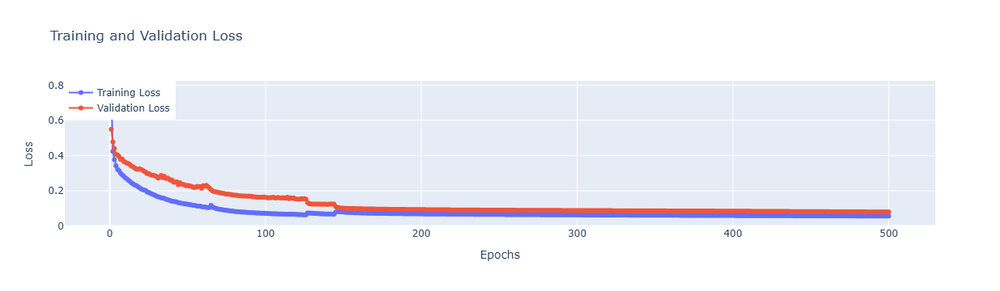

In [4]:
# Plot training and validation loss using Plotly
def plot_training_history(history):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['loss']) + 1)), y=history.history['loss'],
                        mode='lines+markers',
                        name='Training Loss'))
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['val_loss']) + 1)), y=history.history['val_loss'],
                        mode='lines+markers',
                        name='Validation Loss'))

    fig.update_layout(title='Training and Validation Loss',
                   xaxis_title='Epochs',
                   yaxis_title='Loss',
                   legend=dict(x=0, y=1))
    fig.show()

# Display the training history plot
plot_training_history(history)

In [5]:
# Save the enhanced model
model_save_path = 'SOTS_hybrid_unet_rdn_model_with_attention_resnet50'
enhanced_model.save(model_save_path)
print(f"Model saved to {model_save_path} in TensorFlow SavedModel format.")

# Load the saved model with custom loss function
loaded_model = load_model(model_save_path, custom_objects={'combined_resnet_loss': combined_resnet_loss})
print("Model loaded successfully.")

INFO:tensorflow:Assets written to: SOTS_hybrid_unet_rdn_model_with_attention_resnet50\assets


INFO:tensorflow:Assets written to: SOTS_hybrid_unet_rdn_model_with_attention_resnet50\assets


Model saved to SOTS_hybrid_unet_rdn_model_with_attention_resnet50 in TensorFlow SavedModel format.
Model loaded successfully.


Evaluating Model:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 794ms/step


Evaluating Model:   0%|                                                               | 1/1000 [00:02<35:12,  2.11s/it]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:   0%|▏                                                              | 2/1000 [00:02<19:53,  1.20s/it]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   0%|▏                                                              | 3/1000 [00:03<15:25,  1.08it/s]

1/1 [==============================] - 0s 121ms/step


Evaluating Model:   0%|▎                                                              | 4/1000 [00:03<13:13,  1.26it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:   0%|▎                                                              | 5/1000 [00:04<11:41,  1.42it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:   1%|▍                                                              | 6/1000 [00:05<11:18,  1.47it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:   1%|▍                                                              | 7/1000 [00:05<10:28,  1.58it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:   1%|▌                                                              | 8/1000 [00:06<10:49,  1.53it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:   1%|▌                                                              | 9/1000 [00:06<10:30,  1.57it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   1%|▌                                                             | 10/1000 [00:07<09:56,  1.66it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:   1%|▋                                                             | 11/1000 [00:07<09:51,  1.67it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:   1%|▋                                                             | 12/1000 [00:08<09:29,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:   1%|▊                                                             | 13/1000 [00:09<09:42,  1.69it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:   1%|▊                                                             | 14/1000 [00:09<09:24,  1.75it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:   2%|▉                                                             | 15/1000 [00:10<09:32,  1.72it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   2%|▉                                                             | 16/1000 [00:10<09:23,  1.75it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:   2%|█                                                             | 17/1000 [00:11<09:19,  1.76it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:   2%|█                                                             | 18/1000 [00:11<09:24,  1.74it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   2%|█▏                                                            | 19/1000 [00:12<09:34,  1.71it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:   2%|█▏                                                            | 20/1000 [00:13<09:25,  1.73it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:   2%|█▎                                                            | 21/1000 [00:13<09:09,  1.78it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:   2%|█▎                                                            | 22/1000 [00:14<09:17,  1.75it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   2%|█▍                                                            | 23/1000 [00:14<09:06,  1.79it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:   2%|█▍                                                            | 24/1000 [00:15<08:58,  1.81it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:   2%|█▌                                                            | 25/1000 [00:15<09:04,  1.79it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   3%|█▌                                                            | 26/1000 [00:16<08:58,  1.81it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   3%|█▋                                                            | 27/1000 [00:17<09:10,  1.77it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:   3%|█▋                                                            | 28/1000 [00:17<09:03,  1.79it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   3%|█▊                                                            | 29/1000 [00:18<09:27,  1.71it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:   3%|█▊                                                            | 30/1000 [00:18<09:19,  1.73it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:   3%|█▉                                                            | 31/1000 [00:19<09:28,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:   3%|█▉                                                            | 32/1000 [00:20<09:33,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:   3%|██                                                            | 33/1000 [00:20<09:15,  1.74it/s]

1/1 [==============================] - 0s 109ms/step


Evaluating Model:   3%|██                                                            | 34/1000 [00:21<09:21,  1.72it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:   4%|██▏                                                           | 35/1000 [00:21<09:14,  1.74it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   4%|██▏                                                           | 36/1000 [00:22<09:27,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   4%|██▎                                                           | 37/1000 [00:22<09:13,  1.74it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:   4%|██▎                                                           | 38/1000 [00:23<09:21,  1.71it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   4%|██▍                                                           | 39/1000 [00:24<09:22,  1.71it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   4%|██▍                                                           | 40/1000 [00:24<09:08,  1.75it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:   4%|██▌                                                           | 41/1000 [00:25<09:29,  1.68it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:   4%|██▌                                                           | 42/1000 [00:25<09:12,  1.73it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   4%|██▋                                                           | 43/1000 [00:26<09:09,  1.74it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:   4%|██▋                                                           | 44/1000 [00:26<09:13,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:   4%|██▊                                                           | 45/1000 [00:27<09:05,  1.75it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:   5%|██▊                                                           | 46/1000 [00:28<09:19,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   5%|██▉                                                           | 47/1000 [00:28<09:20,  1.70it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:   5%|██▉                                                           | 48/1000 [00:29<09:17,  1.71it/s]

1/1 [==============================] - 0s 78ms/step


Evaluating Model:   5%|███                                                           | 49/1000 [00:29<09:13,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:   5%|███                                                           | 50/1000 [00:30<09:02,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   5%|███▏                                                          | 51/1000 [00:30<09:04,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:   5%|███▏                                                          | 52/1000 [00:31<08:50,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   5%|███▎                                                          | 53/1000 [00:32<08:49,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   5%|███▎                                                          | 54/1000 [00:32<08:42,  1.81it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:   6%|███▍                                                          | 55/1000 [00:33<08:59,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   6%|███▍                                                          | 56/1000 [00:33<08:46,  1.79it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:   6%|███▌                                                          | 57/1000 [00:34<08:54,  1.77it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:   6%|███▌                                                          | 58/1000 [00:34<08:51,  1.77it/s]

1/1 [==============================] - 0s 76ms/step


Evaluating Model:   6%|███▋                                                          | 59/1000 [00:35<08:48,  1.78it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:   6%|███▋                                                          | 60/1000 [00:36<09:09,  1.71it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:   6%|███▊                                                          | 61/1000 [00:36<08:57,  1.75it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:   6%|███▊                                                          | 62/1000 [00:37<09:15,  1.69it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:   6%|███▉                                                          | 63/1000 [00:37<09:06,  1.71it/s]

1/1 [==============================] - 0s 85ms/step


Evaluating Model:   6%|███▉                                                          | 64/1000 [00:38<09:02,  1.73it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:   6%|████                                                          | 65/1000 [00:38<09:04,  1.72it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:   7%|████                                                          | 66/1000 [00:39<09:10,  1.70it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:   7%|████▏                                                         | 67/1000 [00:40<09:30,  1.63it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   7%|████▏                                                         | 68/1000 [00:40<09:17,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:   7%|████▎                                                         | 69/1000 [00:41<09:02,  1.72it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   7%|████▎                                                         | 70/1000 [00:41<09:02,  1.71it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:   7%|████▍                                                         | 71/1000 [00:42<08:51,  1.75it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:   7%|████▍                                                         | 72/1000 [00:43<08:55,  1.73it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:   7%|████▌                                                         | 73/1000 [00:43<08:42,  1.78it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   7%|████▌                                                         | 74/1000 [00:44<08:57,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:   8%|████▋                                                         | 75/1000 [00:44<08:53,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:   8%|████▋                                                         | 76/1000 [00:45<08:40,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:   8%|████▊                                                         | 77/1000 [00:45<08:40,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:   8%|████▊                                                         | 78/1000 [00:46<08:38,  1.78it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:   8%|████▉                                                         | 79/1000 [00:47<08:51,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   8%|████▉                                                         | 80/1000 [00:47<08:36,  1.78it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:   8%|█████                                                         | 81/1000 [00:48<08:50,  1.73it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:   8%|█████                                                         | 82/1000 [00:48<08:37,  1.78it/s]

1/1 [==============================] - 0s 80ms/step


Evaluating Model:   8%|█████▏                                                        | 83/1000 [00:49<08:46,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:   8%|█████▏                                                        | 84/1000 [00:49<08:52,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:   8%|█████▎                                                        | 85/1000 [00:50<08:59,  1.70it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   9%|█████▎                                                        | 86/1000 [00:51<09:14,  1.65it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:   9%|█████▍                                                        | 87/1000 [00:51<09:02,  1.68it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:   9%|█████▍                                                        | 88/1000 [00:52<09:14,  1.64it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:   9%|█████▌                                                        | 89/1000 [00:53<09:16,  1.64it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:   9%|█████▌                                                        | 90/1000 [00:53<08:55,  1.70it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:   9%|█████▋                                                        | 91/1000 [00:54<09:02,  1.67it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   9%|█████▋                                                        | 92/1000 [00:54<08:46,  1.72it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:   9%|█████▊                                                        | 93/1000 [00:55<08:50,  1.71it/s]

1/1 [==============================] - 0s 106ms/step


Evaluating Model:   9%|█████▊                                                        | 94/1000 [00:55<09:07,  1.65it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  10%|█████▉                                                        | 95/1000 [00:56<08:45,  1.72it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  10%|█████▉                                                        | 96/1000 [00:57<08:54,  1.69it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  10%|██████                                                        | 97/1000 [00:57<09:06,  1.65it/s]

1/1 [==============================] - 0s 84ms/step


Evaluating Model:  10%|██████                                                        | 98/1000 [00:58<08:58,  1.68it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  10%|██████▏                                                       | 99/1000 [00:58<09:17,  1.62it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  10%|██████                                                       | 100/1000 [00:59<08:54,  1.68it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  10%|██████▏                                                      | 101/1000 [01:00<09:04,  1.65it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  10%|██████▏                                                      | 102/1000 [01:00<08:47,  1.70it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  10%|██████▎                                                      | 103/1000 [01:01<08:53,  1.68it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  10%|██████▎                                                      | 104/1000 [01:01<08:44,  1.71it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  10%|██████▍                                                      | 105/1000 [01:02<08:31,  1.75it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  11%|██████▍                                                      | 106/1000 [01:03<08:50,  1.69it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  11%|██████▌                                                      | 107/1000 [01:03<08:47,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  11%|██████▌                                                      | 108/1000 [01:04<08:53,  1.67it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  11%|██████▋                                                      | 109/1000 [01:04<08:59,  1.65it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  11%|██████▋                                                      | 110/1000 [01:05<08:46,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  11%|██████▊                                                      | 111/1000 [01:06<08:53,  1.67it/s]

1/1 [==============================] - 0s 108ms/step


Evaluating Model:  11%|██████▊                                                      | 112/1000 [01:06<08:56,  1.65it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  11%|██████▉                                                      | 113/1000 [01:07<09:09,  1.61it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  11%|██████▉                                                      | 114/1000 [01:07<09:13,  1.60it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  12%|███████                                                      | 115/1000 [01:08<08:56,  1.65it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  12%|███████                                                      | 116/1000 [01:09<09:09,  1.61it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  12%|███████▏                                                     | 117/1000 [01:09<09:04,  1.62it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  12%|███████▏                                                     | 118/1000 [01:10<08:57,  1.64it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  12%|███████▎                                                     | 119/1000 [01:10<08:55,  1.64it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  12%|███████▎                                                     | 120/1000 [01:11<08:48,  1.66it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  12%|███████▍                                                     | 121/1000 [01:12<09:07,  1.61it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  12%|███████▍                                                     | 122/1000 [01:12<08:59,  1.63it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  12%|███████▌                                                     | 123/1000 [01:13<08:43,  1.68it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  12%|███████▌                                                     | 124/1000 [01:14<08:49,  1.65it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  12%|███████▋                                                     | 125/1000 [01:14<08:39,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  13%|███████▋                                                     | 126/1000 [01:15<08:45,  1.66it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  13%|███████▋                                                     | 127/1000 [01:15<08:29,  1.71it/s]

1/1 [==============================] - 0s 74ms/step


Evaluating Model:  13%|███████▊                                                     | 128/1000 [01:16<08:36,  1.69it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  13%|███████▊                                                     | 129/1000 [01:16<08:33,  1.70it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  13%|███████▉                                                     | 130/1000 [01:17<08:29,  1.71it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  13%|███████▉                                                     | 131/1000 [01:18<08:34,  1.69it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  13%|████████                                                     | 132/1000 [01:18<08:22,  1.73it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  13%|████████                                                     | 133/1000 [01:19<08:17,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  13%|████████▏                                                    | 134/1000 [01:19<08:09,  1.77it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  14%|████████▏                                                    | 135/1000 [01:20<08:13,  1.75it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  14%|████████▎                                                    | 136/1000 [01:20<08:20,  1.73it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  14%|████████▎                                                    | 137/1000 [01:21<08:13,  1.75it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  14%|████████▍                                                    | 138/1000 [01:22<08:28,  1.70it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  14%|████████▍                                                    | 139/1000 [01:22<08:15,  1.74it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  14%|████████▌                                                    | 140/1000 [01:23<08:10,  1.75it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  14%|████████▌                                                    | 141/1000 [01:23<07:58,  1.80it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  14%|████████▋                                                    | 142/1000 [01:24<08:19,  1.72it/s]

1/1 [==============================] - 0s 75ms/step


Evaluating Model:  14%|████████▋                                                    | 143/1000 [01:24<08:19,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  14%|████████▊                                                    | 144/1000 [01:25<08:16,  1.73it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  14%|████████▊                                                    | 145/1000 [01:26<08:25,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  15%|████████▉                                                    | 146/1000 [01:26<08:09,  1.74it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  15%|████████▉                                                    | 147/1000 [01:27<08:13,  1.73it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  15%|█████████                                                    | 148/1000 [01:27<08:18,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  15%|█████████                                                    | 149/1000 [01:28<08:24,  1.69it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  15%|█████████▏                                                   | 150/1000 [01:29<08:36,  1.64it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  15%|█████████▏                                                   | 151/1000 [01:29<08:27,  1.67it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  15%|█████████▎                                                   | 152/1000 [01:30<08:18,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  15%|█████████▎                                                   | 153/1000 [01:30<08:11,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  15%|█████████▍                                                   | 154/1000 [01:31<08:00,  1.76it/s]

1/1 [==============================] - 0s 93ms/step


Evaluating Model:  16%|█████████▍                                                   | 155/1000 [01:32<08:16,  1.70it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  16%|█████████▌                                                   | 156/1000 [01:32<08:04,  1.74it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  16%|█████████▌                                                   | 157/1000 [01:33<08:13,  1.71it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  16%|█████████▋                                                   | 158/1000 [01:33<08:11,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  16%|█████████▋                                                   | 159/1000 [01:34<08:12,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  16%|█████████▊                                                   | 160/1000 [01:34<08:13,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  16%|█████████▊                                                   | 161/1000 [01:35<08:05,  1.73it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  16%|█████████▉                                                   | 162/1000 [01:36<08:05,  1.72it/s]

1/1 [==============================] - 0s 76ms/step


Evaluating Model:  16%|█████████▉                                                   | 163/1000 [01:36<08:25,  1.66it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  16%|██████████                                                   | 164/1000 [01:37<08:29,  1.64it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  16%|██████████                                                   | 165/1000 [01:37<08:31,  1.63it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  17%|██████████▏                                                  | 166/1000 [01:38<08:09,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  17%|██████████▏                                                  | 167/1000 [01:39<08:18,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  17%|██████████▏                                                  | 168/1000 [01:39<08:22,  1.66it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  17%|██████████▎                                                  | 169/1000 [01:40<08:10,  1.69it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  17%|██████████▎                                                  | 170/1000 [01:40<08:03,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  17%|██████████▍                                                  | 171/1000 [01:41<07:54,  1.75it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  17%|██████████▍                                                  | 172/1000 [01:42<08:04,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  17%|██████████▌                                                  | 173/1000 [01:42<07:51,  1.75it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  17%|██████████▌                                                  | 174/1000 [01:43<07:55,  1.74it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  18%|██████████▋                                                  | 175/1000 [01:43<07:48,  1.76it/s]

1/1 [==============================] - 0s 80ms/step


Evaluating Model:  18%|██████████▋                                                  | 176/1000 [01:44<07:47,  1.76it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  18%|██████████▊                                                  | 177/1000 [01:44<07:54,  1.73it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  18%|██████████▊                                                  | 178/1000 [01:45<07:40,  1.78it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  18%|██████████▉                                                  | 179/1000 [01:46<07:50,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  18%|██████████▉                                                  | 180/1000 [01:46<07:41,  1.78it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  18%|███████████                                                  | 181/1000 [01:47<07:41,  1.77it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  18%|███████████                                                  | 182/1000 [01:47<07:37,  1.79it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  18%|███████████▏                                                 | 183/1000 [01:48<07:35,  1.79it/s]

1/1 [==============================] - 0s 91ms/step


Evaluating Model:  18%|███████████▏                                                 | 184/1000 [01:48<07:37,  1.79it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  18%|███████████▎                                                 | 185/1000 [01:49<07:36,  1.79it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  19%|███████████▎                                                 | 186/1000 [01:49<07:53,  1.72it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  19%|███████████▍                                                 | 187/1000 [01:50<07:55,  1.71it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  19%|███████████▍                                                 | 188/1000 [01:51<08:12,  1.65it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  19%|███████████▌                                                 | 189/1000 [01:51<07:57,  1.70it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  19%|███████████▌                                                 | 190/1000 [01:52<07:59,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  19%|███████████▋                                                 | 191/1000 [01:52<08:03,  1.67it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  19%|███████████▋                                                 | 192/1000 [01:53<07:56,  1.70it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  19%|███████████▊                                                 | 193/1000 [01:54<08:02,  1.67it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  19%|███████████▊                                                 | 194/1000 [01:54<07:51,  1.71it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  20%|███████████▉                                                 | 195/1000 [01:55<07:54,  1.70it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  20%|███████████▉                                                 | 196/1000 [01:55<08:02,  1.67it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  20%|████████████                                                 | 197/1000 [01:56<07:49,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  20%|████████████                                                 | 198/1000 [01:57<07:58,  1.68it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  20%|████████████▏                                                | 199/1000 [01:57<07:53,  1.69it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  20%|████████████▏                                                | 200/1000 [01:58<07:51,  1.70it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  20%|████████████▎                                                | 201/1000 [01:58<07:51,  1.69it/s]

1/1 [==============================] - 0s 82ms/step


Evaluating Model:  20%|████████████▎                                                | 202/1000 [01:59<07:50,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  20%|████████████▍                                                | 203/1000 [02:00<07:59,  1.66it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  20%|████████████▍                                                | 204/1000 [02:00<07:57,  1.67it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  20%|████████████▌                                                | 205/1000 [02:01<07:45,  1.71it/s]

1/1 [==============================] - 0s 110ms/step


Evaluating Model:  21%|████████████▌                                                | 206/1000 [02:01<07:58,  1.66it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  21%|████████████▋                                                | 207/1000 [02:02<07:49,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  21%|████████████▋                                                | 208/1000 [02:03<07:58,  1.65it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  21%|████████████▋                                                | 209/1000 [02:03<08:00,  1.65it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  21%|████████████▊                                                | 210/1000 [02:04<08:04,  1.63it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  21%|████████████▊                                                | 211/1000 [02:04<07:57,  1.65it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  21%|████████████▉                                                | 212/1000 [02:05<07:50,  1.68it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  21%|████████████▉                                                | 213/1000 [02:06<07:48,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  21%|█████████████                                                | 214/1000 [02:06<07:42,  1.70it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  22%|█████████████                                                | 215/1000 [02:07<07:32,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  22%|█████████████▏                                               | 216/1000 [02:07<07:20,  1.78it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  22%|█████████████▏                                               | 217/1000 [02:08<07:40,  1.70it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  22%|█████████████▎                                               | 218/1000 [02:08<07:35,  1.72it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  22%|█████████████▎                                               | 219/1000 [02:09<07:22,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  22%|█████████████▍                                               | 220/1000 [02:10<07:33,  1.72it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  22%|█████████████▍                                               | 221/1000 [02:10<07:18,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  22%|█████████████▌                                               | 222/1000 [02:11<07:24,  1.75it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  22%|█████████████▌                                               | 223/1000 [02:11<07:24,  1.75it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  22%|█████████████▋                                               | 224/1000 [02:12<07:15,  1.78it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  22%|█████████████▋                                               | 225/1000 [02:12<07:11,  1.80it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  23%|█████████████▊                                               | 226/1000 [02:13<07:02,  1.83it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  23%|█████████████▊                                               | 227/1000 [02:13<07:07,  1.81it/s]

1/1 [==============================] - 0s 91ms/step


Evaluating Model:  23%|█████████████▉                                               | 228/1000 [02:14<07:18,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  23%|█████████████▉                                               | 229/1000 [02:15<07:33,  1.70it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  23%|██████████████                                               | 230/1000 [02:15<07:16,  1.77it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  23%|██████████████                                               | 231/1000 [02:16<07:17,  1.76it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  23%|██████████████▏                                              | 232/1000 [02:16<07:11,  1.78it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  23%|██████████████▏                                              | 233/1000 [02:17<07:30,  1.70it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  23%|██████████████▎                                              | 234/1000 [02:18<07:25,  1.72it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  24%|██████████████▎                                              | 235/1000 [02:18<07:20,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  24%|██████████████▍                                              | 236/1000 [02:19<07:18,  1.74it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  24%|██████████████▍                                              | 237/1000 [02:19<07:11,  1.77it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  24%|██████████████▌                                              | 238/1000 [02:20<07:09,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  24%|██████████████▌                                              | 239/1000 [02:20<07:04,  1.79it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  24%|██████████████▋                                              | 240/1000 [02:21<07:16,  1.74it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  24%|██████████████▋                                              | 241/1000 [02:22<07:23,  1.71it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  24%|██████████████▊                                              | 242/1000 [02:22<07:34,  1.67it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  24%|██████████████▊                                              | 243/1000 [02:23<07:19,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  24%|██████████████▉                                              | 244/1000 [02:23<07:16,  1.73it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  24%|██████████████▉                                              | 245/1000 [02:24<07:08,  1.76it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  25%|███████████████                                              | 246/1000 [02:24<07:11,  1.75it/s]

1/1 [==============================] - 0s 44ms/step


Evaluating Model:  25%|███████████████                                              | 247/1000 [02:25<07:01,  1.79it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  25%|███████████████▏                                             | 248/1000 [02:26<07:14,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  25%|███████████████▏                                             | 249/1000 [02:26<07:05,  1.77it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  25%|███████████████▎                                             | 250/1000 [02:27<07:18,  1.71it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  25%|███████████████▎                                             | 251/1000 [02:27<07:07,  1.75it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  25%|███████████████▎                                             | 252/1000 [02:28<07:19,  1.70it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  25%|███████████████▍                                             | 253/1000 [02:29<07:23,  1.68it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  25%|███████████████▍                                             | 254/1000 [02:29<07:09,  1.74it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  26%|███████████████▌                                             | 255/1000 [02:30<07:13,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  26%|███████████████▌                                             | 256/1000 [02:30<07:08,  1.74it/s]

1/1 [==============================] - 0s 106ms/step


Evaluating Model:  26%|███████████████▋                                             | 257/1000 [02:31<07:02,  1.76it/s]

1/1 [==============================] - 0s 93ms/step


Evaluating Model:  26%|███████████████▋                                             | 258/1000 [02:31<06:54,  1.79it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  26%|███████████████▊                                             | 259/1000 [02:32<06:53,  1.79it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  26%|███████████████▊                                             | 260/1000 [02:32<07:00,  1.76it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  26%|███████████████▉                                             | 261/1000 [02:33<07:06,  1.73it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  26%|███████████████▉                                             | 262/1000 [02:34<07:09,  1.72it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  26%|████████████████                                             | 263/1000 [02:34<06:58,  1.76it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  26%|████████████████                                             | 264/1000 [02:35<07:04,  1.74it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  26%|████████████████▏                                            | 265/1000 [02:35<07:00,  1.75it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  27%|████████████████▏                                            | 266/1000 [02:36<06:57,  1.76it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  27%|████████████████▎                                            | 267/1000 [02:36<07:00,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  27%|████████████████▎                                            | 268/1000 [02:37<06:47,  1.80it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  27%|████████████████▍                                            | 269/1000 [02:38<06:56,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  27%|████████████████▍                                            | 270/1000 [02:38<06:48,  1.79it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  27%|████████████████▌                                            | 271/1000 [02:39<06:58,  1.74it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  27%|████████████████▌                                            | 272/1000 [02:39<06:49,  1.78it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  27%|████████████████▋                                            | 273/1000 [02:40<06:46,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  27%|████████████████▋                                            | 274/1000 [02:40<06:45,  1.79it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  28%|████████████████▊                                            | 275/1000 [02:41<06:51,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  28%|████████████████▊                                            | 276/1000 [02:42<06:59,  1.73it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  28%|████████████████▉                                            | 277/1000 [02:42<06:47,  1.78it/s]

1/1 [==============================] - 0s 106ms/step


Evaluating Model:  28%|████████████████▉                                            | 278/1000 [02:43<07:00,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  28%|█████████████████                                            | 279/1000 [02:43<06:48,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  28%|█████████████████                                            | 280/1000 [02:44<06:46,  1.77it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  28%|█████████████████▏                                           | 281/1000 [02:44<06:50,  1.75it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  28%|█████████████████▏                                           | 282/1000 [02:45<06:47,  1.76it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  28%|█████████████████▎                                           | 283/1000 [02:46<07:01,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  28%|█████████████████▎                                           | 284/1000 [02:46<06:46,  1.76it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  28%|█████████████████▍                                           | 285/1000 [02:47<06:55,  1.72it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  29%|█████████████████▍                                           | 286/1000 [02:47<06:48,  1.75it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  29%|█████████████████▌                                           | 287/1000 [02:48<06:40,  1.78it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  29%|█████████████████▌                                           | 288/1000 [02:48<06:40,  1.78it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  29%|█████████████████▋                                           | 289/1000 [02:49<06:33,  1.81it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  29%|█████████████████▋                                           | 290/1000 [02:50<06:44,  1.76it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  29%|█████████████████▊                                           | 291/1000 [02:50<06:33,  1.80it/s]

1/1 [==============================] - 0s 110ms/step


Evaluating Model:  29%|█████████████████▊                                           | 292/1000 [02:51<06:34,  1.79it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  29%|█████████████████▊                                           | 293/1000 [02:51<06:26,  1.83it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  29%|█████████████████▉                                           | 294/1000 [02:52<06:40,  1.76it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  30%|█████████████████▉                                           | 295/1000 [02:52<06:33,  1.79it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  30%|██████████████████                                           | 296/1000 [02:53<06:30,  1.80it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  30%|██████████████████                                           | 297/1000 [02:53<06:32,  1.79it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  30%|██████████████████▏                                          | 298/1000 [02:54<06:28,  1.81it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  30%|██████████████████▏                                          | 299/1000 [02:55<06:43,  1.74it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  30%|██████████████████▎                                          | 300/1000 [02:55<06:41,  1.74it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  30%|██████████████████▎                                          | 301/1000 [02:56<06:39,  1.75it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  30%|██████████████████▍                                          | 302/1000 [02:56<06:31,  1.78it/s]

1/1 [==============================] - 0s 106ms/step


Evaluating Model:  30%|██████████████████▍                                          | 303/1000 [02:57<06:44,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  30%|██████████████████▌                                          | 304/1000 [02:57<06:40,  1.74it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  30%|██████████████████▌                                          | 305/1000 [02:58<06:47,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  31%|██████████████████▋                                          | 306/1000 [02:59<06:49,  1.70it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  31%|██████████████████▋                                          | 307/1000 [02:59<06:33,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  31%|██████████████████▊                                          | 308/1000 [03:00<06:33,  1.76it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  31%|██████████████████▊                                          | 309/1000 [03:00<06:27,  1.78it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  31%|██████████████████▉                                          | 310/1000 [03:01<06:33,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  31%|██████████████████▉                                          | 311/1000 [03:01<06:30,  1.77it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  31%|███████████████████                                          | 312/1000 [03:02<06:27,  1.78it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  31%|███████████████████                                          | 313/1000 [03:03<06:37,  1.73it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  31%|███████████████████▏                                         | 314/1000 [03:03<06:27,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  32%|███████████████████▏                                         | 315/1000 [03:04<06:35,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  32%|███████████████████▎                                         | 316/1000 [03:04<06:25,  1.78it/s]

1/1 [==============================] - 0s 116ms/step


Evaluating Model:  32%|███████████████████▎                                         | 317/1000 [03:05<06:29,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  32%|███████████████████▍                                         | 318/1000 [03:05<06:25,  1.77it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  32%|███████████████████▍                                         | 319/1000 [03:06<06:27,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  32%|███████████████████▌                                         | 320/1000 [03:07<06:32,  1.73it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  32%|███████████████████▌                                         | 321/1000 [03:07<06:22,  1.78it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  32%|███████████████████▋                                         | 322/1000 [03:08<06:25,  1.76it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  32%|███████████████████▋                                         | 323/1000 [03:08<06:29,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  32%|███████████████████▊                                         | 324/1000 [03:09<06:35,  1.71it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  32%|███████████████████▊                                         | 325/1000 [03:09<06:34,  1.71it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  33%|███████████████████▉                                         | 326/1000 [03:10<06:18,  1.78it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  33%|███████████████████▉                                         | 327/1000 [03:11<06:24,  1.75it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  33%|████████████████████                                         | 328/1000 [03:11<06:31,  1.72it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  33%|████████████████████                                         | 329/1000 [03:12<06:22,  1.75it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  33%|████████████████████▏                                        | 330/1000 [03:12<06:12,  1.80it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  33%|████████████████████▏                                        | 331/1000 [03:13<06:09,  1.81it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  33%|████████████████████▎                                        | 332/1000 [03:13<06:07,  1.82it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  33%|████████████████████▎                                        | 333/1000 [03:14<06:07,  1.82it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  33%|████████████████████▎                                        | 334/1000 [03:14<06:04,  1.83it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  34%|████████████████████▍                                        | 335/1000 [03:15<06:00,  1.85it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  34%|████████████████████▍                                        | 336/1000 [03:16<06:09,  1.80it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  34%|████████████████████▌                                        | 337/1000 [03:16<06:03,  1.82it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  34%|████████████████████▌                                        | 338/1000 [03:17<06:21,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  34%|████████████████████▋                                        | 339/1000 [03:17<06:09,  1.79it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  34%|████████████████████▋                                        | 340/1000 [03:18<06:15,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  34%|████████████████████▊                                        | 341/1000 [03:18<06:21,  1.73it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  34%|████████████████████▊                                        | 342/1000 [03:19<06:16,  1.75it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  34%|████████████████████▉                                        | 343/1000 [03:20<06:24,  1.71it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  34%|████████████████████▉                                        | 344/1000 [03:20<06:18,  1.74it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  34%|█████████████████████                                        | 345/1000 [03:21<06:25,  1.70it/s]

1/1 [==============================] - 0s 93ms/step


Evaluating Model:  35%|█████████████████████                                        | 346/1000 [03:21<06:18,  1.73it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  35%|█████████████████████▏                                       | 347/1000 [03:22<06:15,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  35%|█████████████████████▏                                       | 348/1000 [03:22<06:17,  1.73it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  35%|█████████████████████▎                                       | 349/1000 [03:23<06:10,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  35%|█████████████████████▎                                       | 350/1000 [03:24<06:42,  1.62it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  35%|█████████████████████▍                                       | 351/1000 [03:24<06:35,  1.64it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  35%|█████████████████████▍                                       | 352/1000 [03:25<06:23,  1.69it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  35%|█████████████████████▌                                       | 353/1000 [03:25<06:19,  1.71it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  35%|█████████████████████▌                                       | 354/1000 [03:26<06:09,  1.75it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  36%|█████████████████████▋                                       | 355/1000 [03:27<06:12,  1.73it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  36%|█████████████████████▋                                       | 356/1000 [03:27<06:11,  1.74it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  36%|█████████████████████▊                                       | 357/1000 [03:28<06:14,  1.72it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  36%|█████████████████████▊                                       | 358/1000 [03:28<06:07,  1.75it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  36%|█████████████████████▉                                       | 359/1000 [03:29<06:04,  1.76it/s]

1/1 [==============================] - 0s 80ms/step


Evaluating Model:  36%|█████████████████████▉                                       | 360/1000 [03:30<06:27,  1.65it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  36%|██████████████████████                                       | 361/1000 [03:30<06:18,  1.69it/s]

1/1 [==============================] - 0s 93ms/step


Evaluating Model:  36%|██████████████████████                                       | 362/1000 [03:31<06:24,  1.66it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  36%|██████████████████████▏                                      | 363/1000 [03:31<06:16,  1.69it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  36%|██████████████████████▏                                      | 364/1000 [03:32<06:13,  1.70it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  36%|██████████████████████▎                                      | 365/1000 [03:32<06:13,  1.70it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  37%|██████████████████████▎                                      | 366/1000 [03:33<06:14,  1.69it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  37%|██████████████████████▍                                      | 367/1000 [03:34<06:21,  1.66it/s]

1/1 [==============================] - 0s 74ms/step


Evaluating Model:  37%|██████████████████████▍                                      | 368/1000 [03:34<06:19,  1.67it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  37%|██████████████████████▌                                      | 369/1000 [03:35<06:16,  1.67it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  37%|██████████████████████▌                                      | 370/1000 [03:36<06:23,  1.64it/s]

1/1 [==============================] - 0s 109ms/step


Evaluating Model:  37%|██████████████████████▋                                      | 371/1000 [03:36<06:17,  1.67it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  37%|██████████████████████▋                                      | 372/1000 [03:37<06:18,  1.66it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  37%|██████████████████████▊                                      | 373/1000 [03:37<06:13,  1.68it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  37%|██████████████████████▊                                      | 374/1000 [03:38<06:09,  1.69it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  38%|██████████████████████▉                                      | 375/1000 [03:39<06:23,  1.63it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  38%|██████████████████████▉                                      | 376/1000 [03:39<06:15,  1.66it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  38%|██████████████████████▉                                      | 377/1000 [03:40<06:24,  1.62it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  38%|███████████████████████                                      | 378/1000 [03:40<06:15,  1.66it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  38%|███████████████████████                                      | 379/1000 [03:41<06:11,  1.67it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  38%|███████████████████████▏                                     | 380/1000 [03:42<06:17,  1.64it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  38%|███████████████████████▏                                     | 381/1000 [03:42<06:08,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  38%|███████████████████████▎                                     | 382/1000 [03:43<06:08,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  38%|███████████████████████▎                                     | 383/1000 [03:43<05:56,  1.73it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  38%|███████████████████████▍                                     | 384/1000 [03:44<06:02,  1.70it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  38%|███████████████████████▍                                     | 385/1000 [03:44<06:03,  1.69it/s]

1/1 [==============================] - 0s 78ms/step


Evaluating Model:  39%|███████████████████████▌                                     | 386/1000 [03:45<05:54,  1.73it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  39%|███████████████████████▌                                     | 387/1000 [03:46<05:57,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  39%|███████████████████████▋                                     | 388/1000 [03:46<05:45,  1.77it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  39%|███████████████████████▋                                     | 389/1000 [03:47<05:43,  1.78it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  39%|███████████████████████▊                                     | 390/1000 [03:47<05:43,  1.77it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  39%|███████████████████████▊                                     | 391/1000 [03:48<05:47,  1.75it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  39%|███████████████████████▉                                     | 392/1000 [03:48<05:53,  1.72it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  39%|███████████████████████▉                                     | 393/1000 [03:49<05:44,  1.76it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  39%|████████████████████████                                     | 394/1000 [03:50<05:46,  1.75it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  40%|████████████████████████                                     | 395/1000 [03:50<05:40,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  40%|████████████████████████▏                                    | 396/1000 [03:51<05:49,  1.73it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  40%|████████████████████████▏                                    | 397/1000 [03:51<05:46,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  40%|████████████████████████▎                                    | 398/1000 [03:52<05:40,  1.77it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  40%|████████████████████████▎                                    | 399/1000 [03:52<05:45,  1.74it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  40%|████████████████████████▍                                    | 400/1000 [03:53<05:41,  1.76it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  40%|████████████████████████▍                                    | 401/1000 [03:54<05:44,  1.74it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  40%|████████████████████████▌                                    | 402/1000 [03:54<05:36,  1.78it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  40%|████████████████████████▌                                    | 403/1000 [03:55<05:50,  1.70it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  40%|████████████████████████▋                                    | 404/1000 [03:55<05:43,  1.73it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  40%|████████████████████████▋                                    | 405/1000 [03:56<05:37,  1.76it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  41%|████████████████████████▊                                    | 406/1000 [03:56<05:39,  1.75it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  41%|████████████████████████▊                                    | 407/1000 [03:57<05:37,  1.76it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  41%|████████████████████████▉                                    | 408/1000 [03:58<05:44,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  41%|████████████████████████▉                                    | 409/1000 [03:58<05:37,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  41%|█████████████████████████                                    | 410/1000 [03:59<05:40,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  41%|█████████████████████████                                    | 411/1000 [03:59<05:32,  1.77it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  41%|█████████████████████████▏                                   | 412/1000 [04:00<05:34,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  41%|█████████████████████████▏                                   | 413/1000 [04:00<05:42,  1.71it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  41%|█████████████████████████▎                                   | 414/1000 [04:01<05:33,  1.76it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  42%|█████████████████████████▎                                   | 415/1000 [04:02<05:41,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  42%|█████████████████████████▍                                   | 416/1000 [04:02<05:36,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  42%|█████████████████████████▍                                   | 417/1000 [04:03<05:29,  1.77it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  42%|█████████████████████████▍                                   | 418/1000 [04:03<05:24,  1.79it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  42%|█████████████████████████▌                                   | 419/1000 [04:04<05:20,  1.81it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  42%|█████████████████████████▌                                   | 420/1000 [04:04<05:23,  1.79it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  42%|█████████████████████████▋                                   | 421/1000 [04:05<05:19,  1.81it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  42%|█████████████████████████▋                                   | 422/1000 [04:06<05:27,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  42%|█████████████████████████▊                                   | 423/1000 [04:06<05:23,  1.78it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  42%|█████████████████████████▊                                   | 424/1000 [04:07<05:31,  1.74it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  42%|█████████████████████████▉                                   | 425/1000 [04:07<05:24,  1.77it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  43%|█████████████████████████▉                                   | 426/1000 [04:08<05:23,  1.77it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  43%|██████████████████████████                                   | 427/1000 [04:08<05:18,  1.80it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  43%|██████████████████████████                                   | 428/1000 [04:09<05:13,  1.82it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  43%|██████████████████████████▏                                  | 429/1000 [04:09<05:15,  1.81it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  43%|██████████████████████████▏                                  | 430/1000 [04:10<05:12,  1.83it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  43%|██████████████████████████▎                                  | 431/1000 [04:11<05:20,  1.77it/s]

1/1 [==============================] - 0s 93ms/step


Evaluating Model:  43%|██████████████████████████▎                                  | 432/1000 [04:11<05:25,  1.74it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  43%|██████████████████████████▍                                  | 433/1000 [04:12<05:30,  1.72it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  43%|██████████████████████████▍                                  | 434/1000 [04:12<05:30,  1.71it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  44%|██████████████████████████▌                                  | 435/1000 [04:13<05:32,  1.70it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  44%|██████████████████████████▌                                  | 436/1000 [04:14<05:35,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  44%|██████████████████████████▋                                  | 437/1000 [04:14<05:29,  1.71it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  44%|██████████████████████████▋                                  | 438/1000 [04:15<05:24,  1.73it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  44%|██████████████████████████▊                                  | 439/1000 [04:15<05:18,  1.76it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  44%|██████████████████████████▊                                  | 440/1000 [04:16<05:16,  1.77it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  44%|██████████████████████████▉                                  | 441/1000 [04:16<05:17,  1.76it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  44%|██████████████████████████▉                                  | 442/1000 [04:17<05:13,  1.78it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  44%|███████████████████████████                                  | 443/1000 [04:17<05:13,  1.78it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  44%|███████████████████████████                                  | 444/1000 [04:18<05:04,  1.83it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  44%|███████████████████████████▏                                 | 445/1000 [04:19<05:12,  1.78it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  45%|███████████████████████████▏                                 | 446/1000 [04:19<05:05,  1.81it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  45%|███████████████████████████▎                                 | 447/1000 [04:20<05:18,  1.74it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  45%|███████████████████████████▎                                 | 448/1000 [04:20<05:12,  1.77it/s]

1/1 [==============================] - 0s 79ms/step


Evaluating Model:  45%|███████████████████████████▍                                 | 449/1000 [04:21<05:06,  1.80it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  45%|███████████████████████████▍                                 | 450/1000 [04:21<05:04,  1.80it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  45%|███████████████████████████▌                                 | 451/1000 [04:22<05:11,  1.76it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  45%|███████████████████████████▌                                 | 452/1000 [04:23<05:13,  1.75it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  45%|███████████████████████████▋                                 | 453/1000 [04:23<05:06,  1.79it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  45%|███████████████████████████▋                                 | 454/1000 [04:24<05:19,  1.71it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  46%|███████████████████████████▊                                 | 455/1000 [04:24<05:11,  1.75it/s]

1/1 [==============================] - 0s 75ms/step


Evaluating Model:  46%|███████████████████████████▊                                 | 456/1000 [04:25<05:09,  1.76it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  46%|███████████████████████████▉                                 | 457/1000 [04:25<05:09,  1.75it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  46%|███████████████████████████▉                                 | 458/1000 [04:26<05:05,  1.77it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  46%|███████████████████████████▉                                 | 459/1000 [04:27<05:09,  1.75it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  46%|████████████████████████████                                 | 460/1000 [04:27<05:04,  1.77it/s]

1/1 [==============================] - 0s 87ms/step


Evaluating Model:  46%|████████████████████████████                                 | 461/1000 [04:28<05:04,  1.77it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  46%|████████████████████████████▏                                | 462/1000 [04:28<05:00,  1.79it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  46%|████████████████████████████▏                                | 463/1000 [04:29<05:07,  1.75it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  46%|████████████████████████████▎                                | 464/1000 [04:29<05:06,  1.75it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  46%|████████████████████████████▎                                | 465/1000 [04:30<04:56,  1.81it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  47%|████████████████████████████▍                                | 466/1000 [04:30<05:03,  1.76it/s]

1/1 [==============================] - 0s 76ms/step


Evaluating Model:  47%|████████████████████████████▍                                | 467/1000 [04:31<05:00,  1.77it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  47%|████████████████████████████▌                                | 468/1000 [04:32<05:09,  1.72it/s]

1/1 [==============================] - 0s 106ms/step


Evaluating Model:  47%|████████████████████████████▌                                | 469/1000 [04:32<05:06,  1.73it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  47%|████████████████████████████▋                                | 470/1000 [04:33<05:14,  1.69it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  47%|████████████████████████████▋                                | 471/1000 [04:33<05:11,  1.70it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  47%|████████████████████████████▊                                | 472/1000 [04:34<04:59,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  47%|████████████████████████████▊                                | 473/1000 [04:35<05:03,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  47%|████████████████████████████▉                                | 474/1000 [04:35<04:55,  1.78it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  48%|████████████████████████████▉                                | 475/1000 [04:36<05:00,  1.75it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  48%|█████████████████████████████                                | 476/1000 [04:36<04:59,  1.75it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  48%|█████████████████████████████                                | 477/1000 [04:37<04:52,  1.79it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  48%|█████████████████████████████▏                               | 478/1000 [04:37<04:57,  1.76it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  48%|█████████████████████████████▏                               | 479/1000 [04:38<04:56,  1.76it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  48%|█████████████████████████████▎                               | 480/1000 [04:39<05:03,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  48%|█████████████████████████████▎                               | 481/1000 [04:39<04:53,  1.77it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  48%|█████████████████████████████▍                               | 482/1000 [04:40<05:02,  1.71it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  48%|█████████████████████████████▍                               | 483/1000 [04:40<04:58,  1.73it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  48%|█████████████████████████████▌                               | 484/1000 [04:41<04:56,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  48%|█████████████████████████████▌                               | 485/1000 [04:41<04:58,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  49%|█████████████████████████████▋                               | 486/1000 [04:42<04:51,  1.76it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  49%|█████████████████████████████▋                               | 487/1000 [04:43<04:58,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  49%|█████████████████████████████▊                               | 488/1000 [04:43<04:49,  1.77it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  49%|█████████████████████████████▊                               | 489/1000 [04:44<05:01,  1.70it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  49%|█████████████████████████████▉                               | 490/1000 [04:44<04:51,  1.75it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  49%|█████████████████████████████▉                               | 491/1000 [04:45<04:47,  1.77it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  49%|██████████████████████████████                               | 492/1000 [04:45<04:45,  1.78it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  49%|██████████████████████████████                               | 493/1000 [04:46<04:39,  1.81it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  49%|██████████████████████████████▏                              | 494/1000 [04:46<04:44,  1.78it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  50%|██████████████████████████████▏                              | 495/1000 [04:47<04:39,  1.80it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  50%|██████████████████████████████▎                              | 496/1000 [04:48<04:51,  1.73it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  50%|██████████████████████████████▎                              | 497/1000 [04:48<04:46,  1.75it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  50%|██████████████████████████████▍                              | 498/1000 [04:49<04:48,  1.74it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  50%|██████████████████████████████▍                              | 499/1000 [04:49<04:47,  1.74it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  50%|██████████████████████████████▌                              | 500/1000 [04:50<04:43,  1.76it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  50%|██████████████████████████████▌                              | 501/1000 [04:51<04:51,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  50%|██████████████████████████████▌                              | 502/1000 [04:51<04:45,  1.74it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  50%|██████████████████████████████▋                              | 503/1000 [04:52<04:51,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  50%|██████████████████████████████▋                              | 504/1000 [04:52<04:43,  1.75it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  50%|██████████████████████████████▊                              | 505/1000 [04:53<04:47,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  51%|██████████████████████████████▊                              | 506/1000 [04:53<04:44,  1.74it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  51%|██████████████████████████████▉                              | 507/1000 [04:54<04:38,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  51%|██████████████████████████████▉                              | 508/1000 [04:55<04:43,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  51%|███████████████████████████████                              | 509/1000 [04:55<04:33,  1.80it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  51%|███████████████████████████████                              | 510/1000 [04:56<04:35,  1.78it/s]

1/1 [==============================] - 0s 85ms/step


Evaluating Model:  51%|███████████████████████████████▏                             | 511/1000 [04:56<04:34,  1.78it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  51%|███████████████████████████████▏                             | 512/1000 [04:57<04:34,  1.78it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  51%|███████████████████████████████▎                             | 513/1000 [04:57<04:31,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  51%|███████████████████████████████▎                             | 514/1000 [04:58<04:31,  1.79it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  52%|███████████████████████████████▍                             | 515/1000 [04:58<04:34,  1.76it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  52%|███████████████████████████████▍                             | 516/1000 [04:59<04:32,  1.78it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  52%|███████████████████████████████▌                             | 517/1000 [05:00<04:39,  1.73it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  52%|███████████████████████████████▌                             | 518/1000 [05:00<04:35,  1.75it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  52%|███████████████████████████████▋                             | 519/1000 [05:01<04:34,  1.76it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  52%|███████████████████████████████▋                             | 520/1000 [05:01<04:29,  1.78it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  52%|███████████████████████████████▊                             | 521/1000 [05:02<04:26,  1.80it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  52%|███████████████████████████████▊                             | 522/1000 [05:02<04:27,  1.79it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  52%|███████████████████████████████▉                             | 523/1000 [05:03<04:25,  1.80it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  52%|███████████████████████████████▉                             | 524/1000 [05:04<04:32,  1.75it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  52%|████████████████████████████████                             | 525/1000 [05:04<04:27,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  53%|████████████████████████████████                             | 526/1000 [05:05<04:32,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  53%|████████████████████████████████▏                            | 527/1000 [05:05<04:27,  1.77it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  53%|████████████████████████████████▏                            | 528/1000 [05:06<04:31,  1.74it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  53%|████████████████████████████████▎                            | 529/1000 [05:06<04:33,  1.72it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  53%|████████████████████████████████▎                            | 530/1000 [05:07<04:27,  1.76it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  53%|████████████████████████████████▍                            | 531/1000 [05:08<04:33,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  53%|████████████████████████████████▍                            | 532/1000 [05:08<04:24,  1.77it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  53%|████████████████████████████████▌                            | 533/1000 [05:09<04:26,  1.76it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  53%|████████████████████████████████▌                            | 534/1000 [05:09<04:22,  1.77it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  54%|████████████████████████████████▋                            | 535/1000 [05:10<04:28,  1.73it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  54%|████████████████████████████████▋                            | 536/1000 [05:10<04:26,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  54%|████████████████████████████████▊                            | 537/1000 [05:11<04:30,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  54%|████████████████████████████████▊                            | 538/1000 [05:12<04:32,  1.70it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  54%|████████████████████████████████▉                            | 539/1000 [05:12<04:24,  1.74it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  54%|████████████████████████████████▉                            | 540/1000 [05:13<04:23,  1.75it/s]

1/1 [==============================] - 0s 90ms/step


Evaluating Model:  54%|█████████████████████████████████                            | 541/1000 [05:13<04:19,  1.77it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  54%|█████████████████████████████████                            | 542/1000 [05:14<04:30,  1.69it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  54%|█████████████████████████████████                            | 543/1000 [05:15<04:35,  1.66it/s]

1/1 [==============================] - 0s 91ms/step


Evaluating Model:  54%|█████████████████████████████████▏                           | 544/1000 [05:15<04:31,  1.68it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  55%|█████████████████████████████████▏                           | 545/1000 [05:16<04:33,  1.66it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  55%|█████████████████████████████████▎                           | 546/1000 [05:16<04:33,  1.66it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  55%|█████████████████████████████████▎                           | 547/1000 [05:17<04:24,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  55%|█████████████████████████████████▍                           | 548/1000 [05:18<04:29,  1.68it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  55%|█████████████████████████████████▍                           | 549/1000 [05:18<04:20,  1.73it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  55%|█████████████████████████████████▌                           | 550/1000 [05:19<04:22,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  55%|█████████████████████████████████▌                           | 551/1000 [05:19<04:14,  1.76it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  55%|█████████████████████████████████▋                           | 552/1000 [05:20<04:10,  1.79it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  55%|█████████████████████████████████▋                           | 553/1000 [05:20<04:16,  1.74it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  55%|█████████████████████████████████▊                           | 554/1000 [05:21<04:23,  1.69it/s]

1/1 [==============================] - 0s 91ms/step


Evaluating Model:  56%|█████████████████████████████████▊                           | 555/1000 [05:22<04:28,  1.66it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  56%|█████████████████████████████████▉                           | 556/1000 [05:22<04:15,  1.74it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  56%|█████████████████████████████████▉                           | 557/1000 [05:23<04:11,  1.76it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  56%|██████████████████████████████████                           | 558/1000 [05:23<04:08,  1.78it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  56%|██████████████████████████████████                           | 559/1000 [05:24<04:18,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  56%|██████████████████████████████████▏                          | 560/1000 [05:24<04:18,  1.70it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  56%|██████████████████████████████████▏                          | 561/1000 [05:25<04:10,  1.75it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  56%|██████████████████████████████████▎                          | 562/1000 [05:26<04:19,  1.69it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  56%|██████████████████████████████████▎                          | 563/1000 [05:26<04:11,  1.73it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  56%|██████████████████████████████████▍                          | 564/1000 [05:27<04:12,  1.73it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  56%|██████████████████████████████████▍                          | 565/1000 [05:27<04:18,  1.68it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  57%|██████████████████████████████████▌                          | 566/1000 [05:28<04:12,  1.72it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  57%|██████████████████████████████████▌                          | 567/1000 [05:29<04:17,  1.68it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  57%|██████████████████████████████████▋                          | 568/1000 [05:29<04:09,  1.73it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  57%|██████████████████████████████████▋                          | 569/1000 [05:30<04:12,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  57%|██████████████████████████████████▊                          | 570/1000 [05:30<04:05,  1.75it/s]

1/1 [==============================] - 0s 74ms/step


Evaluating Model:  57%|██████████████████████████████████▊                          | 571/1000 [05:31<04:06,  1.74it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  57%|██████████████████████████████████▉                          | 572/1000 [05:31<04:07,  1.73it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  57%|██████████████████████████████████▉                          | 573/1000 [05:32<04:04,  1.75it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  57%|███████████████████████████████████                          | 574/1000 [05:33<04:10,  1.70it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  57%|███████████████████████████████████                          | 575/1000 [05:33<04:14,  1.67it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  58%|███████████████████████████████████▏                         | 576/1000 [05:34<04:09,  1.70it/s]

1/1 [==============================] - 0s 99ms/step


Evaluating Model:  58%|███████████████████████████████████▏                         | 577/1000 [05:34<04:09,  1.70it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  58%|███████████████████████████████████▎                         | 578/1000 [05:35<04:05,  1.72it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  58%|███████████████████████████████████▎                         | 579/1000 [05:36<04:14,  1.66it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  58%|███████████████████████████████████▍                         | 580/1000 [05:36<04:05,  1.71it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  58%|███████████████████████████████████▍                         | 581/1000 [05:37<04:08,  1.68it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  58%|███████████████████████████████████▌                         | 582/1000 [05:37<04:04,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  58%|███████████████████████████████████▌                         | 583/1000 [05:38<04:05,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  58%|███████████████████████████████████▌                         | 584/1000 [05:38<04:04,  1.70it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  58%|███████████████████████████████████▋                         | 585/1000 [05:39<03:57,  1.75it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  59%|███████████████████████████████████▋                         | 586/1000 [05:40<03:59,  1.73it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  59%|███████████████████████████████████▊                         | 587/1000 [05:40<03:53,  1.77it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  59%|███████████████████████████████████▊                         | 588/1000 [05:41<03:54,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  59%|███████████████████████████████████▉                         | 589/1000 [05:41<03:54,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  59%|███████████████████████████████████▉                         | 590/1000 [05:42<03:52,  1.77it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  59%|████████████████████████████████████                         | 591/1000 [05:42<03:51,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  59%|████████████████████████████████████                         | 592/1000 [05:43<03:50,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  59%|████████████████████████████████████▏                        | 593/1000 [05:44<03:58,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  59%|████████████████████████████████████▏                        | 594/1000 [05:44<03:50,  1.76it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  60%|████████████████████████████████████▎                        | 595/1000 [05:45<03:56,  1.72it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  60%|████████████████████████████████████▎                        | 596/1000 [05:45<03:50,  1.75it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  60%|████████████████████████████████████▍                        | 597/1000 [05:46<03:48,  1.76it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  60%|████████████████████████████████████▍                        | 598/1000 [05:46<03:50,  1.74it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  60%|████████████████████████████████████▌                        | 599/1000 [05:47<03:47,  1.76it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  60%|████████████████████████████████████▌                        | 600/1000 [05:48<03:55,  1.70it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  60%|████████████████████████████████████▋                        | 601/1000 [05:48<03:50,  1.73it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  60%|████████████████████████████████████▋                        | 602/1000 [05:49<03:57,  1.68it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  60%|████████████████████████████████████▊                        | 603/1000 [05:49<03:57,  1.68it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  60%|████████████████████████████████████▊                        | 604/1000 [05:50<03:49,  1.72it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  60%|████████████████████████████████████▉                        | 605/1000 [05:51<03:54,  1.68it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  61%|████████████████████████████████████▉                        | 606/1000 [05:51<03:48,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  61%|█████████████████████████████████████                        | 607/1000 [05:52<03:47,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  61%|█████████████████████████████████████                        | 608/1000 [05:52<03:49,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  61%|█████████████████████████████████████▏                       | 609/1000 [05:53<03:47,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  61%|█████████████████████████████████████▏                       | 610/1000 [05:53<03:47,  1.72it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  61%|█████████████████████████████████████▎                       | 611/1000 [05:54<03:41,  1.76it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  61%|█████████████████████████████████████▎                       | 612/1000 [05:55<03:41,  1.75it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  61%|█████████████████████████████████████▍                       | 613/1000 [05:55<03:36,  1.79it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  61%|█████████████████████████████████████▍                       | 614/1000 [05:56<03:36,  1.78it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  62%|█████████████████████████████████████▌                       | 615/1000 [05:56<03:34,  1.79it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  62%|█████████████████████████████████████▌                       | 616/1000 [05:57<03:45,  1.70it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  62%|█████████████████████████████████████▋                       | 617/1000 [05:58<03:46,  1.69it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  62%|█████████████████████████████████████▋                       | 618/1000 [05:58<03:41,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  62%|█████████████████████████████████████▊                       | 619/1000 [05:59<03:48,  1.67it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  62%|█████████████████████████████████████▊                       | 620/1000 [05:59<03:43,  1.70it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  62%|█████████████████████████████████████▉                       | 621/1000 [06:00<03:45,  1.68it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  62%|█████████████████████████████████████▉                       | 622/1000 [06:00<03:47,  1.66it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  62%|██████████████████████████████████████                       | 623/1000 [06:01<03:40,  1.71it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  62%|██████████████████████████████████████                       | 624/1000 [06:02<03:42,  1.69it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  62%|██████████████████████████████████████▏                      | 625/1000 [06:02<03:36,  1.73it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  63%|██████████████████████████████████████▏                      | 626/1000 [06:03<03:40,  1.70it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  63%|██████████████████████████████████████▏                      | 627/1000 [06:03<03:40,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  63%|██████████████████████████████████████▎                      | 628/1000 [06:04<03:36,  1.72it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  63%|██████████████████████████████████████▎                      | 629/1000 [06:05<03:39,  1.69it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  63%|██████████████████████████████████████▍                      | 630/1000 [06:05<03:39,  1.69it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  63%|██████████████████████████████████████▍                      | 631/1000 [06:06<03:42,  1.66it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  63%|██████████████████████████████████████▌                      | 632/1000 [06:06<03:39,  1.68it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  63%|██████████████████████████████████████▌                      | 633/1000 [06:07<03:32,  1.73it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  63%|██████████████████████████████████████▋                      | 634/1000 [06:08<03:35,  1.70it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  64%|██████████████████████████████████████▋                      | 635/1000 [06:08<03:29,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  64%|██████████████████████████████████████▊                      | 636/1000 [06:09<03:36,  1.68it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  64%|██████████████████████████████████████▊                      | 637/1000 [06:09<03:31,  1.72it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  64%|██████████████████████████████████████▉                      | 638/1000 [06:10<03:27,  1.74it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  64%|██████████████████████████████████████▉                      | 639/1000 [06:10<03:26,  1.75it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  64%|███████████████████████████████████████                      | 640/1000 [06:11<03:26,  1.75it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  64%|███████████████████████████████████████                      | 641/1000 [06:12<03:28,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  64%|███████████████████████████████████████▏                     | 642/1000 [06:12<03:25,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  64%|███████████████████████████████████████▏                     | 643/1000 [06:13<03:28,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  64%|███████████████████████████████████████▎                     | 644/1000 [06:13<03:24,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  64%|███████████████████████████████████████▎                     | 645/1000 [06:14<03:21,  1.76it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  65%|███████████████████████████████████████▍                     | 646/1000 [06:14<03:22,  1.75it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  65%|███████████████████████████████████████▍                     | 647/1000 [06:15<03:26,  1.71it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  65%|███████████████████████████████████████▌                     | 648/1000 [06:16<03:31,  1.67it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  65%|███████████████████████████████████████▌                     | 649/1000 [06:16<03:29,  1.67it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  65%|███████████████████████████████████████▋                     | 650/1000 [06:17<03:27,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  65%|███████████████████████████████████████▋                     | 651/1000 [06:17<03:25,  1.70it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  65%|███████████████████████████████████████▊                     | 652/1000 [06:18<03:22,  1.72it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  65%|███████████████████████████████████████▊                     | 653/1000 [06:19<03:20,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  65%|███████████████████████████████████████▉                     | 654/1000 [06:19<03:14,  1.78it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  66%|███████████████████████████████████████▉                     | 655/1000 [06:20<03:19,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  66%|████████████████████████████████████████                     | 656/1000 [06:20<03:16,  1.75it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  66%|████████████████████████████████████████                     | 657/1000 [06:21<03:12,  1.78it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  66%|████████████████████████████████████████▏                    | 658/1000 [06:21<03:13,  1.77it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  66%|████████████████████████████████████████▏                    | 659/1000 [06:22<03:13,  1.77it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  66%|████████████████████████████████████████▎                    | 660/1000 [06:23<03:14,  1.75it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  66%|████████████████████████████████████████▎                    | 661/1000 [06:23<03:14,  1.74it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  66%|████████████████████████████████████████▍                    | 662/1000 [06:24<03:15,  1.73it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  66%|████████████████████████████████████████▍                    | 663/1000 [06:24<03:16,  1.72it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  66%|████████████████████████████████████████▌                    | 664/1000 [06:25<03:10,  1.77it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  66%|████████████████████████████████████████▌                    | 665/1000 [06:25<03:09,  1.77it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  67%|████████████████████████████████████████▋                    | 666/1000 [06:26<03:07,  1.78it/s]

1/1 [==============================] - 0s 92ms/step


Evaluating Model:  67%|████████████████████████████████████████▋                    | 667/1000 [06:27<03:12,  1.73it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  67%|████████████████████████████████████████▋                    | 668/1000 [06:27<03:12,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  67%|████████████████████████████████████████▊                    | 669/1000 [06:28<03:14,  1.70it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  67%|████████████████████████████████████████▊                    | 670/1000 [06:28<03:11,  1.72it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  67%|████████████████████████████████████████▉                    | 671/1000 [06:29<03:08,  1.74it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  67%|████████████████████████████████████████▉                    | 672/1000 [06:29<03:08,  1.74it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  67%|█████████████████████████████████████████                    | 673/1000 [06:30<03:06,  1.75it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  67%|█████████████████████████████████████████                    | 674/1000 [06:31<03:10,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  68%|█████████████████████████████████████████▏                   | 675/1000 [06:31<03:06,  1.75it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  68%|█████████████████████████████████████████▏                   | 676/1000 [06:32<03:08,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  68%|█████████████████████████████████████████▎                   | 677/1000 [06:32<03:10,  1.69it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  68%|█████████████████████████████████████████▎                   | 678/1000 [06:33<03:05,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  68%|█████████████████████████████████████████▍                   | 679/1000 [06:34<03:06,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  68%|█████████████████████████████████████████▍                   | 680/1000 [06:34<03:02,  1.76it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  68%|█████████████████████████████████████████▌                   | 681/1000 [06:35<03:05,  1.72it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  68%|█████████████████████████████████████████▌                   | 682/1000 [06:35<03:01,  1.75it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  68%|█████████████████████████████████████████▋                   | 683/1000 [06:36<03:03,  1.73it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  68%|█████████████████████████████████████████▋                   | 684/1000 [06:36<03:03,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  68%|█████████████████████████████████████████▊                   | 685/1000 [06:37<02:59,  1.75it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  69%|█████████████████████████████████████████▊                   | 686/1000 [06:38<03:03,  1.71it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  69%|█████████████████████████████████████████▉                   | 687/1000 [06:38<03:04,  1.70it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  69%|█████████████████████████████████████████▉                   | 688/1000 [06:39<03:01,  1.72it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  69%|██████████████████████████████████████████                   | 689/1000 [06:39<02:56,  1.77it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  69%|██████████████████████████████████████████                   | 690/1000 [06:40<02:59,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  69%|██████████████████████████████████████████▏                  | 691/1000 [06:40<03:02,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  69%|██████████████████████████████████████████▏                  | 692/1000 [06:41<02:57,  1.74it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  69%|██████████████████████████████████████████▎                  | 693/1000 [06:42<02:58,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  69%|██████████████████████████████████████████▎                  | 694/1000 [06:42<02:55,  1.74it/s]

1/1 [==============================] - 0s 72ms/step


Evaluating Model:  70%|██████████████████████████████████████████▍                  | 695/1000 [06:43<02:56,  1.72it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  70%|██████████████████████████████████████████▍                  | 696/1000 [06:43<02:59,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  70%|██████████████████████████████████████████▌                  | 697/1000 [06:44<02:54,  1.73it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  70%|██████████████████████████████████████████▌                  | 698/1000 [06:45<02:56,  1.71it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  70%|██████████████████████████████████████████▋                  | 699/1000 [06:45<02:57,  1.69it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  70%|██████████████████████████████████████████▋                  | 700/1000 [06:46<02:59,  1.67it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  70%|██████████████████████████████████████████▊                  | 701/1000 [06:46<02:53,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  70%|██████████████████████████████████████████▊                  | 702/1000 [06:47<02:49,  1.76it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  70%|██████████████████████████████████████████▉                  | 703/1000 [06:47<02:50,  1.74it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  70%|██████████████████████████████████████████▉                  | 704/1000 [06:48<02:48,  1.76it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  70%|███████████████████████████████████████████                  | 705/1000 [06:49<02:52,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  71%|███████████████████████████████████████████                  | 706/1000 [06:49<02:50,  1.72it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  71%|███████████████████████████████████████████▏                 | 707/1000 [06:50<02:54,  1.68it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  71%|███████████████████████████████████████████▏                 | 708/1000 [06:50<02:53,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  71%|███████████████████████████████████████████▏                 | 709/1000 [06:51<02:50,  1.71it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  71%|███████████████████████████████████████████▎                 | 710/1000 [06:52<02:50,  1.70it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  71%|███████████████████████████████████████████▎                 | 711/1000 [06:52<02:47,  1.73it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  71%|███████████████████████████████████████████▍                 | 712/1000 [06:53<02:50,  1.69it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  71%|███████████████████████████████████████████▍                 | 713/1000 [06:53<02:48,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  71%|███████████████████████████████████████████▌                 | 714/1000 [06:54<02:47,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  72%|███████████████████████████████████████████▌                 | 715/1000 [06:54<02:50,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  72%|███████████████████████████████████████████▋                 | 716/1000 [06:55<02:45,  1.72it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  72%|███████████████████████████████████████████▋                 | 717/1000 [06:56<02:48,  1.68it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  72%|███████████████████████████████████████████▊                 | 718/1000 [06:56<02:43,  1.73it/s]

1/1 [==============================] - 0s 91ms/step


Evaluating Model:  72%|███████████████████████████████████████████▊                 | 719/1000 [06:57<02:45,  1.70it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  72%|███████████████████████████████████████████▉                 | 720/1000 [06:57<02:44,  1.70it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  72%|███████████████████████████████████████████▉                 | 721/1000 [06:58<02:38,  1.76it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  72%|████████████████████████████████████████████                 | 722/1000 [06:59<02:41,  1.73it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  72%|████████████████████████████████████████████                 | 723/1000 [06:59<02:38,  1.74it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  72%|████████████████████████████████████████████▏                | 724/1000 [07:00<02:42,  1.69it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  72%|████████████████████████████████████████████▏                | 725/1000 [07:00<02:39,  1.73it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  73%|████████████████████████████████████████████▎                | 726/1000 [07:01<02:36,  1.75it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  73%|████████████████████████████████████████████▎                | 727/1000 [07:01<02:35,  1.76it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  73%|████████████████████████████████████████████▍                | 728/1000 [07:02<02:33,  1.78it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  73%|████████████████████████████████████████████▍                | 729/1000 [07:03<02:37,  1.72it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  73%|████████████████████████████████████████████▌                | 730/1000 [07:03<02:39,  1.69it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  73%|████████████████████████████████████████████▌                | 731/1000 [07:04<02:42,  1.66it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  73%|████████████████████████████████████████████▋                | 732/1000 [07:04<02:37,  1.70it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  73%|████████████████████████████████████████████▋                | 733/1000 [07:05<02:36,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  73%|████████████████████████████████████████████▊                | 734/1000 [07:06<02:37,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  74%|████████████████████████████████████████████▊                | 735/1000 [07:06<02:33,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  74%|████████████████████████████████████████████▉                | 736/1000 [07:07<02:35,  1.70it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  74%|████████████████████████████████████████████▉                | 737/1000 [07:07<02:35,  1.70it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  74%|█████████████████████████████████████████████                | 738/1000 [07:08<02:32,  1.72it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  74%|█████████████████████████████████████████████                | 739/1000 [07:08<02:32,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▏               | 740/1000 [07:09<02:28,  1.75it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▏               | 741/1000 [07:10<02:30,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▎               | 742/1000 [07:10<02:30,  1.72it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▎               | 743/1000 [07:11<02:35,  1.66it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▍               | 744/1000 [07:11<02:32,  1.68it/s]

1/1 [==============================] - 0s 98ms/step


Evaluating Model:  74%|█████████████████████████████████████████████▍               | 745/1000 [07:12<02:29,  1.70it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▌               | 746/1000 [07:13<02:32,  1.66it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▌               | 747/1000 [07:13<02:29,  1.69it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▋               | 748/1000 [07:14<02:27,  1.71it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▋               | 749/1000 [07:14<02:26,  1.71it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▊               | 750/1000 [07:15<02:27,  1.69it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▊               | 751/1000 [07:16<02:29,  1.66it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▊               | 752/1000 [07:16<02:25,  1.70it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▉               | 753/1000 [07:17<02:27,  1.68it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  75%|█████████████████████████████████████████████▉               | 754/1000 [07:17<02:22,  1.72it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  76%|██████████████████████████████████████████████               | 755/1000 [07:18<02:23,  1.71it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  76%|██████████████████████████████████████████████               | 756/1000 [07:18<02:24,  1.69it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▏              | 757/1000 [07:19<02:19,  1.75it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▏              | 758/1000 [07:20<02:23,  1.69it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▎              | 759/1000 [07:20<02:21,  1.70it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▎              | 760/1000 [07:21<02:21,  1.69it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▍              | 761/1000 [07:21<02:26,  1.63it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▍              | 762/1000 [07:22<02:21,  1.69it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▌              | 763/1000 [07:23<02:21,  1.67it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▌              | 764/1000 [07:23<02:17,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  76%|██████████████████████████████████████████████▋              | 765/1000 [07:24<02:17,  1.71it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  77%|██████████████████████████████████████████████▋              | 766/1000 [07:24<02:16,  1.71it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  77%|██████████████████████████████████████████████▊              | 767/1000 [07:25<02:12,  1.76it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  77%|██████████████████████████████████████████████▊              | 768/1000 [07:25<02:12,  1.75it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  77%|██████████████████████████████████████████████▉              | 769/1000 [07:26<02:08,  1.80it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  77%|██████████████████████████████████████████████▉              | 770/1000 [07:27<02:13,  1.72it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  77%|███████████████████████████████████████████████              | 771/1000 [07:27<02:10,  1.76it/s]

1/1 [==============================] - 0s 97ms/step


Evaluating Model:  77%|███████████████████████████████████████████████              | 772/1000 [07:28<02:08,  1.77it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  77%|███████████████████████████████████████████████▏             | 773/1000 [07:28<02:07,  1.78it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  77%|███████████████████████████████████████████████▏             | 774/1000 [07:29<02:06,  1.79it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▎             | 775/1000 [07:29<02:07,  1.76it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▎             | 776/1000 [07:30<02:05,  1.78it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▍             | 777/1000 [07:31<02:08,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▍             | 778/1000 [07:31<02:05,  1.76it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▌             | 779/1000 [07:32<02:07,  1.74it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▌             | 780/1000 [07:32<02:07,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▋             | 781/1000 [07:33<02:06,  1.73it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▋             | 782/1000 [07:34<02:12,  1.65it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▊             | 783/1000 [07:34<02:07,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▊             | 784/1000 [07:35<02:05,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  78%|███████████████████████████████████████████████▉             | 785/1000 [07:35<02:07,  1.69it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  79%|███████████████████████████████████████████████▉             | 786/1000 [07:36<02:03,  1.74it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  79%|████████████████████████████████████████████████             | 787/1000 [07:36<02:08,  1.66it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  79%|████████████████████████████████████████████████             | 788/1000 [07:37<02:07,  1.66it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▏            | 789/1000 [07:38<02:07,  1.65it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▏            | 790/1000 [07:38<02:02,  1.71it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▎            | 791/1000 [07:39<01:59,  1.75it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▎            | 792/1000 [07:39<01:58,  1.76it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▎            | 793/1000 [07:40<01:56,  1.78it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  79%|████████████████████████████████████████████████▍            | 794/1000 [07:40<01:57,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▍            | 795/1000 [07:41<01:54,  1.79it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▌            | 796/1000 [07:42<01:57,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▌            | 797/1000 [07:42<01:54,  1.77it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▋            | 798/1000 [07:43<01:54,  1.76it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▋            | 799/1000 [07:43<01:57,  1.71it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▊            | 800/1000 [07:44<01:55,  1.74it/s]

1/1 [==============================] - 0s 103ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▊            | 801/1000 [07:45<01:56,  1.71it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▉            | 802/1000 [07:45<01:54,  1.73it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  80%|████████████████████████████████████████████████▉            | 803/1000 [07:46<01:57,  1.68it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  80%|█████████████████████████████████████████████████            | 804/1000 [07:46<01:53,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  80%|█████████████████████████████████████████████████            | 805/1000 [07:47<01:52,  1.73it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▏           | 806/1000 [07:47<01:52,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▏           | 807/1000 [07:48<01:49,  1.75it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▎           | 808/1000 [07:49<01:52,  1.70it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▎           | 809/1000 [07:49<01:48,  1.76it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▍           | 810/1000 [07:50<01:47,  1.77it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▍           | 811/1000 [07:50<01:45,  1.78it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▌           | 812/1000 [07:51<01:52,  1.68it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▌           | 813/1000 [07:52<01:51,  1.68it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  81%|█████████████████████████████████████████████████▋           | 814/1000 [07:52<01:47,  1.72it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  82%|█████████████████████████████████████████████████▋           | 815/1000 [07:53<01:49,  1.69it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  82%|█████████████████████████████████████████████████▊           | 816/1000 [07:53<01:55,  1.60it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  82%|█████████████████████████████████████████████████▊           | 817/1000 [07:54<01:53,  1.62it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  82%|█████████████████████████████████████████████████▉           | 818/1000 [07:55<01:55,  1.58it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  82%|█████████████████████████████████████████████████▉           | 819/1000 [07:55<01:54,  1.58it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████           | 820/1000 [07:56<01:50,  1.63it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████           | 821/1000 [07:56<01:48,  1.64it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▏          | 822/1000 [07:57<01:44,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▏          | 823/1000 [07:58<01:45,  1.68it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▎          | 824/1000 [07:58<01:42,  1.72it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  82%|██████████████████████████████████████████████████▎          | 825/1000 [07:59<01:42,  1.70it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▍          | 826/1000 [07:59<01:43,  1.68it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▍          | 827/1000 [08:00<01:39,  1.73it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▌          | 828/1000 [08:01<01:42,  1.68it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▌          | 829/1000 [08:01<01:38,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▋          | 830/1000 [08:02<01:41,  1.68it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▋          | 831/1000 [08:02<01:38,  1.72it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▊          | 832/1000 [08:03<01:36,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▊          | 833/1000 [08:03<01:36,  1.74it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  83%|██████████████████████████████████████████████████▊          | 834/1000 [08:04<01:34,  1.75it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  84%|██████████████████████████████████████████████████▉          | 835/1000 [08:05<01:35,  1.74it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  84%|██████████████████████████████████████████████████▉          | 836/1000 [08:05<01:33,  1.75it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████          | 837/1000 [08:06<01:32,  1.77it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████          | 838/1000 [08:06<01:35,  1.70it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▏         | 839/1000 [08:07<01:33,  1.72it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▏         | 840/1000 [08:07<01:33,  1.70it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▎         | 841/1000 [08:08<01:30,  1.75it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▎         | 842/1000 [08:09<01:33,  1.70it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▍         | 843/1000 [08:09<01:30,  1.74it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▍         | 844/1000 [08:10<01:32,  1.69it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  84%|███████████████████████████████████████████████████▌         | 845/1000 [08:10<01:32,  1.68it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▌         | 846/1000 [08:11<01:28,  1.73it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▋         | 847/1000 [08:12<01:31,  1.68it/s]

1/1 [==============================] - 0s 100ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▋         | 848/1000 [08:12<01:28,  1.71it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▊         | 849/1000 [08:13<01:31,  1.65it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▊         | 850/1000 [08:13<01:29,  1.68it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▉         | 851/1000 [08:14<01:27,  1.70it/s]

1/1 [==============================] - 0s 105ms/step


Evaluating Model:  85%|███████████████████████████████████████████████████▉         | 852/1000 [08:15<01:29,  1.66it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  85%|████████████████████████████████████████████████████         | 853/1000 [08:15<01:26,  1.70it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model:  85%|████████████████████████████████████████████████████         | 854/1000 [08:16<01:27,  1.66it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▏        | 855/1000 [08:16<01:24,  1.71it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▏        | 856/1000 [08:17<01:23,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▎        | 857/1000 [08:17<01:24,  1.70it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▎        | 858/1000 [08:18<01:22,  1.73it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▍        | 859/1000 [08:19<01:24,  1.67it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▍        | 860/1000 [08:19<01:21,  1.71it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▌        | 861/1000 [08:20<01:23,  1.67it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▌        | 862/1000 [08:20<01:23,  1.66it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▋        | 863/1000 [08:21<01:21,  1.69it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▋        | 864/1000 [08:22<01:21,  1.66it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  86%|████████████████████████████████████████████████████▊        | 865/1000 [08:22<01:20,  1.67it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  87%|████████████████████████████████████████████████████▊        | 866/1000 [08:23<01:22,  1.62it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  87%|████████████████████████████████████████████████████▉        | 867/1000 [08:24<01:21,  1.62it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  87%|████████████████████████████████████████████████████▉        | 868/1000 [08:24<01:18,  1.67it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████        | 869/1000 [08:25<01:20,  1.63it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████        | 870/1000 [08:25<01:18,  1.66it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▏       | 871/1000 [08:26<01:15,  1.70it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▏       | 872/1000 [08:26<01:16,  1.68it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▎       | 873/1000 [08:27<01:13,  1.72it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  87%|█████████████████████████████████████████████████████▎       | 874/1000 [08:28<01:15,  1.67it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▍       | 875/1000 [08:28<01:12,  1.72it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▍       | 876/1000 [08:29<01:12,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▍       | 877/1000 [08:29<01:11,  1.72it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▌       | 878/1000 [08:30<01:09,  1.75it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▌       | 879/1000 [08:31<01:10,  1.71it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▋       | 880/1000 [08:31<01:08,  1.75it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▋       | 881/1000 [08:32<01:10,  1.69it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▊       | 882/1000 [08:32<01:09,  1.70it/s]

1/1 [==============================] - 0s 77ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▊       | 883/1000 [08:33<01:07,  1.73it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▉       | 884/1000 [08:33<01:07,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  88%|█████████████████████████████████████████████████████▉       | 885/1000 [08:34<01:05,  1.76it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████       | 886/1000 [08:35<01:07,  1.68it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████       | 887/1000 [08:35<01:05,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▏      | 888/1000 [08:36<01:05,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▏      | 889/1000 [08:36<01:03,  1.75it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▎      | 890/1000 [08:37<01:01,  1.78it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▎      | 891/1000 [08:37<01:03,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▍      | 892/1000 [08:38<01:01,  1.76it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▍      | 893/1000 [08:39<01:01,  1.74it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  89%|██████████████████████████████████████████████████████▌      | 894/1000 [08:39<01:01,  1.73it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▌      | 895/1000 [08:40<01:01,  1.71it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▋      | 896/1000 [08:40<00:59,  1.73it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▋      | 897/1000 [08:41<00:59,  1.74it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▊      | 898/1000 [08:41<00:59,  1.73it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▊      | 899/1000 [08:42<01:00,  1.68it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▉      | 900/1000 [08:43<01:00,  1.64it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  90%|██████████████████████████████████████████████████████▉      | 901/1000 [08:43<00:59,  1.67it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████      | 902/1000 [08:44<00:57,  1.70it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████      | 903/1000 [08:45<00:57,  1.70it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████▏     | 904/1000 [08:45<00:54,  1.75it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  90%|███████████████████████████████████████████████████████▏     | 905/1000 [08:46<00:56,  1.68it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▎     | 906/1000 [08:46<00:54,  1.74it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▎     | 907/1000 [08:47<00:54,  1.70it/s]

1/1 [==============================] - 0s 95ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▍     | 908/1000 [08:47<00:54,  1.69it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▍     | 909/1000 [08:48<00:52,  1.74it/s]

1/1 [==============================] - 0s 96ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▌     | 910/1000 [08:49<00:53,  1.69it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▌     | 911/1000 [08:49<00:52,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▋     | 912/1000 [08:50<00:50,  1.74it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▋     | 913/1000 [08:50<00:50,  1.71it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  91%|███████████████████████████████████████████████████████▊     | 914/1000 [08:51<00:49,  1.73it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  92%|███████████████████████████████████████████████████████▊     | 915/1000 [08:52<00:50,  1.67it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  92%|███████████████████████████████████████████████████████▉     | 916/1000 [08:52<00:48,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  92%|███████████████████████████████████████████████████████▉     | 917/1000 [08:53<00:49,  1.66it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  92%|███████████████████████████████████████████████████████▉     | 918/1000 [08:53<00:48,  1.68it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████     | 919/1000 [08:54<00:48,  1.67it/s]

1/1 [==============================] - 0s 64ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████     | 920/1000 [08:54<00:47,  1.69it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▏    | 921/1000 [08:55<00:46,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▏    | 922/1000 [08:56<00:47,  1.64it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▎    | 923/1000 [08:56<00:45,  1.69it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▎    | 924/1000 [08:57<00:45,  1.65it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  92%|████████████████████████████████████████████████████████▍    | 925/1000 [08:58<00:45,  1.66it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▍    | 926/1000 [08:58<00:43,  1.72it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▌    | 927/1000 [08:59<00:42,  1.71it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▌    | 928/1000 [08:59<00:42,  1.70it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▋    | 929/1000 [09:00<00:42,  1.67it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▋    | 930/1000 [09:00<00:41,  1.68it/s]

1/1 [==============================] - 0s 67ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▊    | 931/1000 [09:01<00:39,  1.73it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▊    | 932/1000 [09:02<00:39,  1.71it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▉    | 933/1000 [09:02<00:38,  1.73it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  93%|████████████████████████████████████████████████████████▉    | 934/1000 [09:03<00:38,  1.71it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████    | 935/1000 [09:03<00:37,  1.72it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████    | 936/1000 [09:04<00:36,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▏   | 937/1000 [09:04<00:36,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▏   | 938/1000 [09:05<00:35,  1.75it/s]

1/1 [==============================] - 0s 94ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▎   | 939/1000 [09:06<00:35,  1.74it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▎   | 940/1000 [09:06<00:33,  1.77it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▍   | 941/1000 [09:07<00:34,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▍   | 942/1000 [09:07<00:33,  1.73it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▌   | 943/1000 [09:08<00:32,  1.74it/s]

1/1 [==============================] - 0s 104ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▌   | 944/1000 [09:09<00:32,  1.70it/s]

1/1 [==============================] - 0s 78ms/step


Evaluating Model:  94%|█████████████████████████████████████████████████████████▋   | 945/1000 [09:09<00:31,  1.73it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  95%|█████████████████████████████████████████████████████████▋   | 946/1000 [09:10<00:31,  1.69it/s]

1/1 [==============================] - 0s 107ms/step


Evaluating Model:  95%|█████████████████████████████████████████████████████████▊   | 947/1000 [09:10<00:31,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  95%|█████████████████████████████████████████████████████████▊   | 948/1000 [09:11<00:30,  1.72it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  95%|█████████████████████████████████████████████████████████▉   | 949/1000 [09:11<00:29,  1.72it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  95%|█████████████████████████████████████████████████████████▉   | 950/1000 [09:12<00:29,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████   | 951/1000 [09:13<00:29,  1.68it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████   | 952/1000 [09:13<00:27,  1.72it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████▏  | 953/1000 [09:14<00:26,  1.75it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  95%|██████████████████████████████████████████████████████████▏  | 954/1000 [09:14<00:25,  1.78it/s]

1/1 [==============================] - 0s 73ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▎  | 955/1000 [09:15<00:25,  1.76it/s]

1/1 [==============================] - 0s 77ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▎  | 956/1000 [09:16<00:25,  1.70it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▍  | 957/1000 [09:16<00:25,  1.70it/s]

1/1 [==============================] - 0s 69ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▍  | 958/1000 [09:17<00:25,  1.65it/s]

1/1 [==============================] - 0s 101ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▍  | 959/1000 [09:17<00:24,  1.69it/s]

1/1 [==============================] - 0s 76ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▌  | 960/1000 [09:18<00:23,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▌  | 961/1000 [09:18<00:22,  1.71it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▋  | 962/1000 [09:19<00:21,  1.76it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▋  | 963/1000 [09:20<00:21,  1.71it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▊  | 964/1000 [09:20<00:20,  1.74it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  96%|██████████████████████████████████████████████████████████▊  | 965/1000 [09:21<00:20,  1.70it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model:  97%|██████████████████████████████████████████████████████████▉  | 966/1000 [09:21<00:19,  1.71it/s]

1/1 [==============================] - 0s 70ms/step


Evaluating Model:  97%|██████████████████████████████████████████████████████████▉  | 967/1000 [09:22<00:19,  1.74it/s]

1/1 [==============================] - 0s 102ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████  | 968/1000 [09:22<00:18,  1.73it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████  | 969/1000 [09:23<00:17,  1.74it/s]

1/1 [==============================] - 0s 61ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████▏ | 970/1000 [09:24<00:17,  1.74it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████▏ | 971/1000 [09:24<00:16,  1.73it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████▎ | 972/1000 [09:25<00:16,  1.71it/s]

1/1 [==============================] - 0s 71ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████▎ | 973/1000 [09:25<00:15,  1.70it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  97%|███████████████████████████████████████████████████████████▍ | 974/1000 [09:26<00:15,  1.72it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▍ | 975/1000 [09:27<00:14,  1.72it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▌ | 976/1000 [09:27<00:14,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▌ | 977/1000 [09:28<00:13,  1.72it/s]

1/1 [==============================] - 0s 60ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▋ | 978/1000 [09:28<00:12,  1.74it/s]

1/1 [==============================] - 0s 58ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▋ | 979/1000 [09:29<00:11,  1.77it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▊ | 980/1000 [09:29<00:11,  1.72it/s]

1/1 [==============================] - 0s 59ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▊ | 981/1000 [09:30<00:10,  1.76it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▉ | 982/1000 [09:31<00:10,  1.75it/s]

1/1 [==============================] - 0s 62ms/step


Evaluating Model:  98%|███████████████████████████████████████████████████████████▉ | 983/1000 [09:31<00:09,  1.77it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  98%|████████████████████████████████████████████████████████████ | 984/1000 [09:32<00:09,  1.70it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  98%|████████████████████████████████████████████████████████████ | 985/1000 [09:32<00:08,  1.71it/s]

1/1 [==============================] - 0s 57ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▏| 986/1000 [09:33<00:08,  1.75it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▏| 987/1000 [09:33<00:07,  1.76it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▎| 988/1000 [09:34<00:06,  1.80it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▎| 989/1000 [09:35<00:06,  1.75it/s]

1/1 [==============================] - 0s 65ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▍| 990/1000 [09:35<00:05,  1.74it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▍| 991/1000 [09:36<00:05,  1.71it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▌| 992/1000 [09:36<00:04,  1.77it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▌| 993/1000 [09:37<00:04,  1.72it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model:  99%|████████████████████████████████████████████████████████████▋| 994/1000 [09:37<00:03,  1.71it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████▋| 995/1000 [09:38<00:02,  1.67it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████▊| 996/1000 [09:39<00:02,  1.68it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████▊| 997/1000 [09:39<00:01,  1.74it/s]

1/1 [==============================] - 0s 68ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████▉| 998/1000 [09:40<00:01,  1.75it/s]

1/1 [==============================] - 0s 52ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████▉| 999/1000 [09:40<00:00,  1.77it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████| 1000/1000 [09:41<00:00,  1.72it/s]


PSNR: 30.9044, SSIM: 0.9733, MSE: 0.001061, CIEDE2000: 2.3941
1/1 [==============================] - 0s 51ms/step


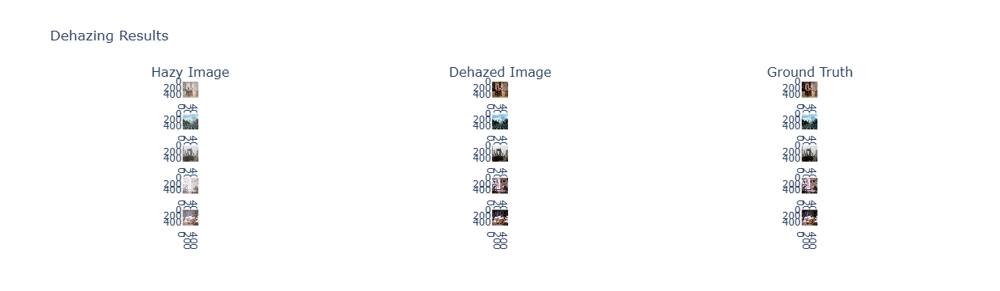

In [6]:
# Function to plot randomly selected dehazed images using Plotly
import plotly.express as px
import plotly.subplots as sp

def plot_random_dehazed_images(model, hazy_img_paths, gt_img_paths=None, num_images=5, target_size=(512, 512)):
    """Plot randomly selected dehazed images alongside their hazy versions and ground truths."""
    selected_indices = random.sample(range(len(hazy_img_paths)), num_images)
    fig = sp.make_subplots(rows=num_images, cols=3, subplot_titles=["Hazy Image", "Dehazed Image", "Ground Truth"])
    
    for i, idx in enumerate(selected_indices):
        # Load and preprocess the hazy image
        hazy_img = Image.open(hazy_img_paths[idx])
        hazy_img = hazy_img.resize(target_size)
        hazy_img = np.array(hazy_img) / 255.0
        hazy_input = np.expand_dims(hazy_img, axis=0)
        
        # Predict the dehazed image
        dehazed_img = model.predict(hazy_input)[0]
        
        # Post-process dehazed output to visualize correctly
        dehazed_img = np.clip(dehazed_img, 0, 1)
        
        # Load the ground truth image if available
        gt_img = None
        if gt_img_paths is not None and len(gt_img_paths) > 0:
            gt_img = Image.open(gt_img_paths[idx])
            gt_img = gt_img.resize(target_size)
            gt_img = np.array(gt_img) / 255.0
        
        # Add images to subplots
        fig.add_trace(px.imshow(hazy_img).data[0], row=i+1, col=1)
        fig.add_trace(px.imshow(dehazed_img).data[0], row=i+1, col=2)
        if gt_img is not None:
            fig.add_trace(px.imshow(gt_img).data[0], row=i+1, col=3)

    fig.update_layout(height=600 * num_images, title_text="Dehazing Results")
    fig.show()

# Evaluate CIEDE2000 Color Difference
def calculate_ciede2000(image1, image2):
    """Calculate the CIEDE2000 color difference between two images."""
    lab1 = color.rgb2lab(image1)
    lab2 = color.rgb2lab(image2)
    ciede2000 = color.deltaE_ciede2000(lab1, lab2)
    return np.mean(ciede2000)

# Evaluate the model
def evaluate_model(model, dataset, win_size=5):
    psnr_values = []
    ssim_values = []
    mse_values = []
    ciede2000_values = []
    
    for X_batch, y_batch in tqdm(dataset, desc="Evaluating Model"):
        y_pred = model.predict(X_batch)
        for true, pred in zip(y_batch, y_pred):
            if isinstance(true, tf.Tensor):
                true = true.numpy()
            if isinstance(pred, tf.Tensor):
                pred = pred.numpy()
            
            true = true.astype(np.float32)
            pred = pred.astype(np.float32)
            
            psnr = tf.image.psnr(true, pred, max_val=1.0).numpy()
            psnr_values.append(psnr)
            
            ssim_index = ssim(true, pred, channel_axis=-1, data_range=1.0, win_size=win_size)
            ssim_values.append(ssim_index)
            
            mse = np.mean((true - pred) ** 2)
            mse_values.append(mse)
            
            ciede2000 = calculate_ciede2000(true, pred)
            ciede2000_values.append(ciede2000)
    
    return (
        np.mean(psnr_values), 
        np.mean(ssim_values), 
        np.mean(mse_values), 
        np.mean(ciede2000_values)
    )

# Evaluate model
psnr, ssim_index, mse, ciede2000 = evaluate_model(loaded_model, sots_dataset, win_size=5)
print(f"PSNR: {psnr:.4f}, SSIM: {ssim_index:.4f}, MSE: {mse:.6f}, CIEDE2000: {ciede2000:.4f}")

# Plot the randomly selected dehazed images
plot_random_dehazed_images(loaded_model, hazy_paths, clear_paths, num_images=5)